<a href="https://colab.research.google.com/github/MeenakshiRajpurohit/perception-aware-dynamic-diffusion-transformers/blob/main/pa_d2it_phase3_diffusion_finetune.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import subprocess, sys
subprocess.run([sys.executable, "-m", "pip", "uninstall", "-y", "-q", "torchao"], check=False)

CompletedProcess(args=['/usr/bin/python3', '-m', 'pip', 'uninstall', '-y', '-q', 'torchao'], returncode=0)

In [5]:
import importlib.util
print("torchao present:", importlib.util.find_spec("torchao") is not None)  # want False
import peft, diffusers
print("peft", peft.__version__, "| diffusers", diffusers.__version__)

torchao present: False
peft 0.19.1 | diffusers 0.39.0


In [7]:
# ══════════════════════════════════════════════════════════════════════
# PA-D²iT — PHASE 3 : DIFFUSION FINE-TUNING FOR HIGH-QUALITY GENERATION
# ----------------------------------------------------------------------
# This file implements the costed plan from the progress report:
#
#   PHASE A  LoRA (rank 16-32) on a PRETRAINED diffusion model
#            (SD 1.5 default, PixArt-α optional) + a layout adapter,
#            trained on the 5,950 native-resolution crops with the
#            IMPORTANCE-WEIGHTED (safety-weighted) loss,
#            arms w ∈ {1, 5} × 3 seeds = 6 runs.                (F1-F4)
#   PHASE B  500 DDIM samples per arm from the val layouts.       (F5)
#   PHASE C  Object-region FID + KID on VRU crops, and
#            detector mAP (Faster R-CNN trained on generated,
#            evaluated on real val) — the two PRIMARY metrics
#            the proposal promised.                             (F6-F7)
#   EXTRA    Fine-tune OUR OWN dynamic DiTs (the archived v2
#            step-6000 checkpoints) with the safety weight
#            w ∈ {2, 5} — the untested half of the proposal on
#            the from-scratch models, without retraining them.    (F8)
#
# WHY THIS DESIGN (from findings 3.2 / 6.1):
#   * Mixed-grain tokenization is net-negative at small scale, so we
#     DROP dynamic patchify here and keep the half that survives:
#     allocate the OBJECTIVE by semantic importance. That half is a
#     per-pixel loss multiplier → zero architectural surgery → works
#     with any pretrained model → LoRA-compatible.
#   * Entropy and importance are known-equivalent at w=1, so any
#     difference at w=5 is attributable to the safety weighting.
#
# NOTHING ON DRIVE IS RETRAINED. All caches ({ROOT}/data/crop_*) and
# the 45 v2 checkpoints are reused as-is; this file only ADDS
# {ROOT}/v2/lora/ (adapters, samples, metrics — all small).
#
# RUN ORDER (fresh Colab session, GPU runtime):
#   F1 → F2 → F3 → F4 (training) → F5 (sampling) → F6 (FID/KID)
#   → F7 (detector mAP).  F8 additionally needs the consolidated
#   pipeline file run first (see its header).
# ══════════════════════════════════════════════════════════════════════



In [8]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F1 — Bootstrap · installs · Drive · paths
# ════════════════════════════════════════════════════════════════════
import os, sys, subprocess, importlib

def _pip(*pkgs):
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", *pkgs], check=True)

# diffusers stack (versions pinned loosely; bump if Colab's torch moves)
for mod, spec in [("diffusers", "diffusers>=0.27"), ("peft", "peft>=0.10"),
                  ("transformers", "transformers>=4.40"), ("accelerate", "accelerate"),
                  ("torchmetrics", "torchmetrics[image]>=1.3"), ("einops", "einops"),
                  ("torchvision", "torchvision"), ("scipy", "scipy")]:
    try: importlib.import_module(mod)
    except ImportError: _pip(spec)

import glob, json, time, math, gc, random, dataclasses
import numpy as np, torch, torch.nn as nn, torch.nn.functional as TF

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    from google.colab import drive
    if not os.path.ismount("/content/drive"):
        drive.mount("/content/drive")

dev  = "cuda"
L    = "─" * 70
ROOT = "/content/drive/MyDrive/pa_d2it"          # same ROOT as the pipeline
V2   = f"{ROOT}/v2"
os.environ["HF_HOME"] = f"{ROOT}/hf"             # VAE/SD weights cached on Drive

LORA_D = f"{V2}/lora"                            # everything new lives here
for d in ("ckpt", "logs", "samples", "eval"):
    os.makedirs(f"{LORA_D}/{d}", exist_ok=True)

# bf16 on A100/L4, fp16 on T4 — probe once
BF16  = torch.cuda.is_bf16_supported()
DTYPE = torch.bfloat16 if BF16 else torch.float16
print(f"  GPU {torch.cuda.get_device_name(0)} · autocast {DTYPE}")
print(f"  ROOT {ROOT}\n  new outputs → {LORA_D}")

# ── geometry: must match the Phase-2 crop caches exactly ────────────────
IMG_H, IMG_W   = 256, 512
LH, LW         = IMG_H // 8, IMG_W // 8          # 32 × 64 latent
VAE_SCALE      = 0.18215
N_TRAIN_CROPS, N_VAL_CROPS = 2, 1
TAG   = f"crop_{IMG_H}x{IMG_W}_t{N_TRAIN_CROPS}v{N_VAL_CROPS}"

PC = dict(
    imgs   = f"{ROOT}/data/crops_u8_{IMG_H}x{IMG_W}_t{N_TRAIN_CROPS}v{N_VAL_CROPS}.npy",
    plan   = f"{ROOT}/data/crop_plan_{IMG_H}x{IMG_W}_t{N_TRAIN_CROPS}v{N_VAL_CROPS}.npz",
    layout = f"{ROOT}/data/{TAG}_layout_r0.25.npz",
    masks  = f"{ROOT}/data/{TAG}_exact_masks.npz",
    latent = f"{ROOT}/data/{TAG}_latents.npz",
)
missing = [k for k, p in PC.items() if not os.path.exists(p)]
for k, p in PC.items():
    print(f"  {'✓' if os.path.exists(p) else '✗'} {k:7s} {os.path.basename(p)}")
assert not missing, (f"missing Phase-2 caches: {missing} — run the pipeline file "
                     f"SECTIONS 13-16 once to build them (they are on Drive already "
                     f"if Phase 2 ran; this is then a path mismatch).")

# class tiers — identical to the pipeline
VRU_CLASSES     = ["person", "rider"]
VEHICLE_CLASSES = ["car", "truck", "bus", "train", "motorcycle",
                   "bicycle", "caravan", "trailer"]
CLASS_NAMES = ["<pad>"] + VRU_CLASSES + VEHICLE_CLASSES
N_CLS       = len(CLASS_NAMES)
N_VRU_ID    = len(VRU_CLASSES)                   # cls id ≤ this ⇒ VRU



Mounted at /content/drive
  GPU Tesla T4 · autocast torch.bfloat16
  ROOT /content/drive/MyDrive/pa_d2it
  new outputs → /content/drive/MyDrive/pa_d2it/v2/lora
  ✓ imgs    crops_u8_256x512_t2v1.npy
  ✓ plan    crop_plan_256x512_t2v1.npz
  ✓ layout  crop_256x512_t2v1_layout_r0.25.npz
  ✓ masks   crop_256x512_t2v1_exact_masks.npz
  ✓ latent  crop_256x512_t2v1_latents.npz


In [9]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F2 — Data: crop caches → GPU · prompts from layout
# ------------------------------------------------------------
# Reuses the Phase-2 caches unchanged:
#   * cached VAE posteriors (mean/std, both flips) — the frozen VAE is
#     stabilityai/sd-vae-ft-mse, i.e. THE SD-1.5 LATENT SPACE, so the
#     Phase-2 latents feed SD 1.5 LoRA training directly. Zero re-encode.
#   * exact coverage masks (N, 32, 64) — the safety weight is applied
#     through the coverage fraction, exactly as in pipeline Cell 5.
# ════════════════════════════════════════════════════════════════════
t0 = time.time()
_pl  = np.load(PC["plan"],   allow_pickle=False)
CC   = dict(np.load(PC["layout"], allow_pickle=False))
_ms  = np.load(PC["masks"])
_lz  = np.load(PC["latent"])
IMGS = np.load(PC["imgs"], mmap_mode="r")               # N,H,W,3 u8 (for eval refs)

SPLIT = CC["split"] if "split" in CC else _pl["split"]
N_ALL = len(SPLIT)
IDX   = {s: np.where(SPLIT == s)[0] for s in ("train", "val")}

# VAE posterior (fp16, both flips) — z0 = (mean + std·ε) · 0.18215,
# mirroring sample_latent() in the pipeline
LM = torch.from_numpy(_lz["mean"]).to(dev)              # N,2,4,32,64
LS = torch.from_numpy(_lz["std"]).to(dev)

# coverage masks at latent resolution (fp16) — flip is a horizontal flip
VRU_FRAC = torch.from_numpy(_ms["vru"].astype(np.float16)).to(dev)   # N,32,64
VEH_FRAC = torch.from_numpy(_ms["veh"].astype(np.float16)).to(dev)
if VRU_FRAC.shape[-2:] != (LH, LW):                     # guard: cell-grid cache
    VRU_FRAC = TF.interpolate(VRU_FRAC[:, None].float(), (LH, LW), mode="nearest")[:, 0].half()
    VEH_FRAC = TF.interpolate(VEH_FRAC[:, None].float(), (LH, LW), mode="nearest")[:, 0].half()

# padded per-crop boxes for the layout adapter (normalised xyxy)
nb    = np.diff(CC["offsets"])
MAX_B = int(min(np.percentile(nb, 99.5) + 8, nb.max(), 96))
S     = np.array([IMG_W, IMG_H, IMG_W, IMG_H], np.float32)
box_p = np.zeros((N_ALL, MAX_B, 4), np.float32)
cls_p = np.zeros((N_ALL, MAX_B), np.int64)
msk_p = np.zeros((N_ALL, MAX_B), np.float32)
for k in range(N_ALL):
    a, b = CC["offsets"][k], CC["offsets"][k + 1]; n = min(b - a, MAX_B)
    if n:
        box_p[k, :n] = CC["boxes"][a:a + n] / S
        cls_p[k, :n] = CC["clsid"][a:a + n]
        msk_p[k, :n] = 1.0
BOX = torch.from_numpy(box_p).to(dev); CLS = torch.from_numpy(cls_p).to(dev)
MSK = torch.from_numpy(msk_p).to(dev)

# prompts: short, factual, built from the layout (counts, not adjectives)
def prompt_for(k):
    a, b = CC["offsets"][k], CC["offsets"][k + 1]
    ids  = CC["clsid"][a:b]
    n_p  = int((ids == CLASS_NAMES.index("person")).sum())
    n_r  = int((ids == CLASS_NAMES.index("rider")).sum())
    n_v  = int(((ids > N_VRU_ID)).sum())
    bits = ["a photo of a european city street, dashcam viewpoint"]
    if n_p: bits.append(f"{n_p} pedestrian{'s' * (n_p > 1)}")
    if n_r: bits.append(f"{n_r} cyclist{'s' * (n_r > 1)}")
    if n_v: bits.append(f"{n_v} vehicle{'s' * (n_v > 1)}")
    return ", ".join(bits)
PROMPTS = [prompt_for(k) for k in range(N_ALL)]

print(f"  loaded caches in {time.time()-t0:.0f}s · N={N_ALL} "
      f"(train {len(IDX['train'])} / val {len(IDX['val'])}) · MAX_B={MAX_B}")
print(f"  example prompt: “{PROMPTS[int(IDX['train'][0])]}”")
del _lz, _ms



  loaded caches in 9s · N=6450 (train 5950 / val 500) · MAX_B=37
  example prompt: “a photo of a european city street, dashcam viewpoint, 2 pedestrians, 3 vehicles”


In [10]:
!pip uninstall -y torchao
import importlib
importlib.invalidate_caches()
try:
    import peft.import_utils as _piu
    _piu.is_torchao_available.cache_clear()
except Exception:
    pass

In [11]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F3 — Pretrained model · LoRA · layout adapter · safety weight
# ------------------------------------------------------------
# MODEL_KIND:
#   "sd15"   runwayml SD-1.5 UNet, CLIP text encoder      (default, tested path)
#   "pixart" PixArt-α 512 DiT — the pretrained *diffusion image
#            transformer*; same VAE latent space; its transformer
#            predicts (ε, Σ) as 8 channels → we keep the ε half.
#
# The LAYOUT ADAPTER needs no surgery on the pretrained network: each
# box becomes one extra cross-attention token (class embedding + box
# MLP, projected to the text-encoder width) appended to the prompt
# embedding. LoRA (rank R on the attention projections) + the adapter
# are the ONLY trainable parameters.
# ════════════════════════════════════════════════════════════════════
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler, DDIMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model

MODEL_KIND = "sd15"                       # "sd15" | "pixart"
LORA_RANK  = 16

if MODEL_KIND == "sd15":
    MODEL_ID = "runwayml/stable-diffusion-v1-5"
    tokenizer = CLIPTokenizer.from_pretrained(MODEL_ID, subfolder="tokenizer")
    text_enc  = CLIPTextModel.from_pretrained(MODEL_ID, subfolder="text_encoder").to(dev).eval().requires_grad_(False)
    backbone  = UNet2DConditionModel.from_pretrained(MODEL_ID, subfolder="unet").to(dev)
    CTX_DIM   = text_enc.config.hidden_size                       # 768
    lora_targets = ["to_q", "to_k", "to_v", "to_out.0"]
elif MODEL_KIND == "pixart":
    from diffusers import PixArtTransformer2DModel
    from transformers import T5EncoderModel, T5Tokenizer
    MODEL_ID = "PixArt-alpha/PixArt-XL-2-512x512"
    tokenizer = T5Tokenizer.from_pretrained(MODEL_ID, subfolder="tokenizer")
    text_enc  = T5EncoderModel.from_pretrained(MODEL_ID, subfolder="text_encoder",
                                               torch_dtype=torch.float16).to(dev).eval().requires_grad_(False)
    backbone  = PixArtTransformer2DModel.from_pretrained(MODEL_ID, subfolder="transformer").to(dev)
    CTX_DIM   = text_enc.config.d_model                           # 4096
    lora_targets = ["to_q", "to_k", "to_v", "to_out.0"]
else:
    raise ValueError(MODEL_KIND)

# NOTE: no VAE loaded for training — Phase-2 cached posteriors ARE the
# sd-vae-ft-mse latents. The VAE only appears at sampling time (F5).

backbone.requires_grad_(False)
backbone = get_peft_model(backbone, LoraConfig(
    r=LORA_RANK, lora_alpha=LORA_RANK, init_lora_weights="gaussian",
    target_modules=lora_targets))
backbone.enable_gradient_checkpointing()

class LayoutAdapter(nn.Module):
    """boxes (B,MAX_B,4 xyxy∈[0,1]) + classes → MAX_B context tokens."""
    def __init__(self, n_cls=N_CLS, dim=CTX_DIM, ff=256):
        super().__init__()
        self.cls = nn.Embedding(n_cls, ff)
        self.box = nn.Sequential(nn.Linear(4, ff), nn.SiLU(), nn.Linear(ff, ff))
        self.out = nn.Sequential(nn.LayerNorm(ff), nn.Linear(ff, dim))
        nn.init.zeros_(self.out[-1].weight); nn.init.zeros_(self.out[-1].bias)  # start silent
    def forward(self, box, cls, msk):
        h = self.cls(cls) + self.box(box)
        return self.out(h) * msk[..., None]           # padded slots → exact zero

adapter = LayoutAdapter().to(dev)
n_lora  = sum(p.numel() for p in backbone.parameters() if p.requires_grad)
n_adap  = sum(p.numel() for p in adapter.parameters())
print(f"  {MODEL_KIND} loaded · trainable: LoRA {n_lora/1e6:.2f}M + adapter {n_adap/1e6:.2f}M")

# frozen prompt embeddings, computed once (fp16, GPU-resident)
@torch.no_grad()
def embed_prompts(texts, bs=64):
    outs = []
    for i in range(0, len(texts), bs):
        tk = tokenizer(texts[i:i+bs], padding="max_length", truncation=True,
                       max_length=77, return_tensors="pt").to(dev)
        outs.append(text_enc(**tk).last_hidden_state.half())
    return torch.cat(outs)
TXT_EMB   = embed_prompts(PROMPTS)                    # N,77,CTX
NULL_EMB  = embed_prompts([""])                       # 1,77,CTX  (CFG uncond)
print(f"  prompt embeddings cached: {tuple(TXT_EMB.shape)} "
      f"({TXT_EMB.numel()*2/1e9:.2f} GB)")

# ── safety weight — soft, through the coverage fraction (pipeline Cell 5)
def safety_weight(idx, flip, w):
    """W = 1 + (w-1)·cov(VRU), renormalised to mean 1 per image so the
    total gradient scale is unchanged and arms stay loss-comparable."""
    cov = VRU_FRAC[idx].float()                       # B,32,64
    cov = torch.where(flip[:, None, None], cov.flip(-1), cov)
    W = 1.0 + (w - 1.0) * cov
    return W / W.mean(dim=(1, 2), keepdim=True).clamp_min(1e-8)

sched_train = DDPMScheduler.from_pretrained(MODEL_ID, subfolder="scheduler")
ALPHAS = sched_train.alphas_cumprod.to(dev)

def predict_eps(model_out):
    """PixArt outputs (ε, Σ) as 2×C channels; SD outputs ε directly."""
    return model_out.chunk(2, dim=1)[0] if model_out.shape[1] == 8 else model_out



Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors: reconstructing file:   0%|          |  0.00B /  492MB            

text_encoder/model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors: reconstructing file:   0%|          |  0.00B / 3.44GB            

unet/diffusion_pytorch_model.safetensors: downloading bytes:           |  0.00B            

  sd15 loaded · trainable: LoRA 3.19M + adapter 0.27M
  prompt embeddings cached: (6450, 77, 768) (0.76 GB)


scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

In [26]:
import os, gc, math, json, time
import numpy as np, torch, torch.nn.functional as F
from PIL import Image

for _n in ("IMGS", "BOX", "CLS", "MSK", "VRU_FRAC", "PROMPTS", "IDX", "LH", "LW"):
    assert _n in globals(), f"{_n} missing — run cells F1 and F2 first"

# ── free the Phase-A training model; we do not need it here ────────────
for _n in ("opt", "scaler", "backbone", "adapter", "LM", "LS"):
    if _n in globals():
        try: del globals()[_n]
        except Exception: pass
gc.collect(); torch.cuda.empty_cache()
print(f"  free VRAM {torch.cuda.mem_get_info()[0]/2**30:.1f} GB")

# ── generation geometry ───────────────────────────────────────────────
# SD 1.5 was trained at 512².  The cached crops are 256×512, which is well
# below that and degrades quality, so we generate at 384×768 (same total
# area as 512², same 2:1 aspect) and downsample to 256×512 for comparison
# against the real crops.
GEN_H, GEN_W = 384, 768
GLH, GLW     = GEN_H // 8, GEN_W // 8            # 48 × 96 generation latent

R_FINE   = 0.25                                   # fraction of cells that get detail
G_LO     = 6.0                                    # guidance on coarse cells
G_HI     = 12.0                                   # guidance on fine cells
G_UNIFORM = G_LO + (G_HI - G_LO) * R_FINE         # = 7.5, i.e. standard SD CFG
STEPS    = 30
K_REFINE = 3                                      # regions refined per image
REF_PX   = 128                                    # crop size in generated pixels
REF_STRENGTH = 0.35                               # img2img strength for refinement

OUT_D = f"{V2}/regional"
os.makedirs(f"{OUT_D}/grids", exist_ok=True)
os.makedirs(f"{OUT_D}/single", exist_ok=True)

# ── load frozen SD 1.5 (repo id moved around; try the known mirrors) ────
from diffusers import (StableDiffusionPipeline, StableDiffusionImg2ImgPipeline,
                       DDIMScheduler)

SD_CANDIDATES = []
if "SD_ID" in globals(): SD_CANDIDATES.append(SD_ID)      # whatever F3 used
SD_CANDIDATES += ["stable-diffusion-v1-5/stable-diffusion-v1-5",
                  "sd-legacy/stable-diffusion-v1-5",
                  "runwayml/stable-diffusion-v1-5"]

pipe = None
for _id in SD_CANDIDATES:
    try:
        pipe = StableDiffusionPipeline.from_pretrained(
            _id, torch_dtype=torch.float16, safety_checker=None,
            requires_safety_checker=False)
        print(f"  loaded {_id}")
        break
    except Exception as e:
        print(f"  ✗ {_id}: {type(e).__name__}")
assert pipe is not None, "could not load SD 1.5 from any known repo id"

pipe = pipe.to(dev)
pipe.set_progress_bar_config(disable=True)
unet, vae      = pipe.unet, pipe.vae
tokenizer      = pipe.tokenizer
text_encoder   = pipe.text_encoder
SCHED_CFG      = pipe.scheduler.config
VAE_SF         = vae.config.scaling_factor
for m in (unet, vae, text_encoder): m.requires_grad_(False).eval()

i2i = StableDiffusionImg2ImgPipeline(**pipe.components,
                                     requires_safety_checker=False).to(dev)
i2i.set_progress_bar_config(disable=True)
gc.collect(); torch.cuda.empty_cache()
print(f"  free VRAM after load {torch.cuda.mem_get_info()[0]/2**30:.1f} GB")

NEG = ("blurry, low quality, distorted, deformed, cartoon, painting, "
       "watermark, text, duplicate")


@torch.no_grad()
def encode_prompt(prompt, neg=NEG):
    def _enc(s):
        tk = tokenizer([s], padding="max_length", truncation=True,
                       max_length=tokenizer.model_max_length, return_tensors="pt")
        ids = tk.input_ids.to(device=dev, dtype=torch.long)
        return text_encoder(input_ids=ids)[0]
    return _enc(neg), _enc(prompt)


# ── the four grain maps ────────────────────────────────────────────────
def entropy_cells(img_u8, lh, lw, bins=32):
    """Shannon entropy per cell on greyscale — D²iT's signal, reimplemented."""
    g  = np.asarray(Image.fromarray(img_u8).convert("L"))
    H, W = g.shape
    ph, pw = H // lh, W // lw
    g  = g[:lh * ph, :lw * pw].reshape(lh, ph, lw, pw).transpose(0, 2, 1, 3)
    q  = (g.reshape(lh, lw, -1) // (256 // bins)).astype(np.int64)
    out = np.zeros((lh, lw), np.float32)
    for i in range(lh):
        for j in range(lw):
            c = np.bincount(q[i, j], minlength=bins).astype(np.float32)
            p = c[c > 0] / c.sum()
            out[i, j] = float(-(p * np.log2(p)).sum())
    return out


def importance_cells(k):
    """Layout-derived importance: T1 VRU = 1.0, T2 vehicles = 0.6."""
    s = VRU_FRAC[k].float() + 0.6 * VEH_FRAC[k].float()
    return s.cpu().numpy()


def topk_mask(score, r_fine=R_FINE):
    """Fixed budget: the top r_fine fraction of cells become fine. Every arm
    therefore spends exactly the same amount of capacity."""
    lh, lw = score.shape
    kk = max(1, int(round(r_fine * lh * lw)))
    flat = score.ravel()
    thr  = np.partition(flat, -kk)[-kk]
    m = (score >= thr).astype(np.float32)
    if m.sum() > kk:                                  # break ties deterministically
        idx = np.argsort(-flat, kind="stable")[:kk]
        m = np.zeros_like(flat); m[idx] = 1.0; m = m.reshape(lh, lw)
    return m


def grain_maps(k, seed):
    """The four arms, all at identical fine-cell budget."""
    img = np.asarray(IMGS[k])
    rng = np.random.default_rng(seed * 7919 + k)
    return dict(
        importance = topk_mask(importance_cells(k)),
        entropy    = topk_mask(entropy_cells(img, LH, LW)),
        random     = topk_mask(rng.random((LH, LW))),
        uniform    = None,                            # constant guidance
    )


def g_field(mask, smooth=True):
    """cell mask (LH,LW) → guidance field (1,1,GLH,GLW).
    Bilinear + a light blur: finding 3.4 showed background error tracks
    boundary count, so we do not hand the sampler a hard-edged field."""
    if mask is None:
        return torch.full((1, 1, GLH, GLW), G_UNIFORM, device=dev, dtype=torch.float16)
    m = torch.from_numpy(mask)[None, None].to(dev).float()
    m = F.interpolate(m, size=(GLH, GLW), mode="bilinear", align_corners=False)
    if smooth:
        m = F.avg_pool2d(F.pad(m, (1, 1, 1, 1), mode="replicate"), 3, stride=1)
    return (G_LO + (G_HI - G_LO) * m).half()


print(f"  geometry {GEN_H}×{GEN_W} (latent {GLH}×{GLW}) · r_fine {R_FINE} "
      f"→ {int(R_FINE*LH*LW)}/{LH*LW} fine cells")
print(f"  guidance  coarse {G_LO} · fine {G_HI} · uniform {G_UNIFORM} (matched mean)")
print(f"  outputs → {OUT_D}")

# ── override F2's dashcam prompt: these are VRU crops, not full frames ──
def prompt_for_crop(k):
    a, b = CC["offsets"][k], CC["offsets"][k + 1]
    ids  = CC["clsid"][a:b]
    n_p  = int((ids == CLASS_NAMES.index("person")).sum())
    n_r  = int((ids == CLASS_NAMES.index("rider")).sum())
    bits = []
    if n_p: bits.append(f"{n_p} pedestrian{'s' * (n_p > 1)}")
    if n_r: bits.append(f"{n_r} cyclist{'s' * (n_r > 1)}")
    who  = " and ".join(bits) if bits else "people"
    return (f"candid street photography of {who} walking on a european city "
            f"sidewalk, eye level, daylight, sharp focus, 50mm")

PROMPTS = [prompt_for_crop(k) for k in range(N_ALL)]
print(f"  prompt override: “{PROMPTS[PICK[0]] if 'PICK' in globals() else PROMPTS[int(IDX['val'][0])]}”")

  free VRAM 10.1 GB


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

  loaded stable-diffusion-v1-5/stable-diffusion-v1-5
  free VRAM after load 9.1 GB
  geometry 384×768 (latent 48×96) · r_fine 0.25 → 512/2048 fine cells
  guidance  coarse 6.0 · fine 12.0 · uniform 7.5 (matched mean)
  outputs → /content/drive/MyDrive/pa_d2it/v2/regional
  prompt override: “candid street photography of 6 pedestrians walking on a european city sidewalk, eye level, daylight, sharp focus, 50mm”


In [27]:

# %% ════════════════════════════════════════════════════════════════════
# CELL G2 — Regional-CFG sampler + coarse→fine refinement pass
# ----------------------------------------------------------------------
# The only change from a standard CFG loop is one line:
#     eps = eps_uncond + g(x,y) · (eps_cond − eps_uncond)
# with g a spatial field instead of a scalar. Everything else — scheduler,
# weights, noise — is stock SD 1.5.
# ════════════════════════════════════════════════════════════════════
CFG_SPLIT = 0.4        # first 40% of steps: identical for all arms

@torch.no_grad()
def generate(prompt, gmap, seed, steps=STEPS, split=CFG_SPLIT):
    sch = DDIMScheduler.from_config(SCHED_CFG)
    sch.set_timesteps(steps, device=dev)
    gen = torch.Generator(device=dev).manual_seed(seed)
    lat = torch.randn((1, 4, GLH, GLW), generator=gen, device=dev,
                      dtype=torch.float16) * sch.init_noise_sigma
    e_u, e_c = encode_prompt(prompt)
    emb   = torch.cat([e_u, e_c])
    g_uni = torch.full_like(gmap, G_UNIFORM)
    lock  = int(split * steps)                 # composition locked here
    for si, t in enumerate(sch.timesteps):
        inp  = sch.scale_model_input(torch.cat([lat] * 2), t)
        pred = unet(inp, t, encoder_hidden_states=emb).sample
        p_u, p_c = pred.chunk(2)
        eps  = p_u + (g_uni if si < lock else gmap) * (p_c - p_u)
        lat  = sch.step(eps, t, lat).prev_sample
    img = vae.decode(lat / VAE_SF).sample
    img = ((img.float() / 2 + 0.5).clamp(0, 1)[0].permute(1, 2, 0) * 255)
    return Image.fromarray(img.byte().cpu().numpy())


# ── where the fine pass is spent, per arm (matched count and size) ──────
def refine_centers(k, arm, mask, seed, kk=K_REFINE):
    """Return up to kk (cx, cy) centres in GENERATED-pixel coordinates."""
    if arm == "uniform":
        return []
    if arm == "importance":
        sel = MSK[k].bool() & (CLS[k] > 0) & (CLS[k] <= N_VRU_ID)   # VRU boxes
        b = BOX[k][sel].cpu().numpy()
        if len(b) == 0:
            sel = MSK[k].bool() & (CLS[k] > 0)
            b = BOX[k][sel].cpu().numpy()
        if len(b) == 0: return []
        area = (b[:, 2] - b[:, 0]) * (b[:, 3] - b[:, 1])
        b = b[np.argsort(-area)][:kk]
        return [(float((x0 + x1) / 2 * GEN_W), float((y0 + y1) / 2 * GEN_H))
                for x0, y0, x1, y1 in b]
    # entropy / random: greedy top cells with a minimum separation
    score = mask.copy().astype(np.float32)
    score += np.random.default_rng(seed * 31 + k).random(score.shape) * 1e-3
    out, taken = [], []
    for _ in range(kk):
        i, j = np.unravel_index(np.argmax(score), score.shape)
        if score[i, j] <= 0: break
        out.append((float((j + .5) / LW * GEN_W), float((i + .5) / LH * GEN_H)))
        taken.append((i, j)); score[max(0, i-3):i+4, max(0, j-6):j+7] = 0
    return out


def _feather(h, w, pad=16):
    m = np.ones((h, w), np.float32)
    r = np.minimum(np.arange(h)[:, None], np.arange(h)[::-1][:, None]) / pad
    c = np.minimum(np.arange(w)[None, :], np.arange(w)[::-1][None, :]) / pad
    return (m * np.clip(r, 0, 1) * np.clip(c, 0, 1))[..., None]


@torch.no_grad()
def refine(img, centers, prompt, seed, px=REF_PX, strength=REF_STRENGTH,
           steps=STEPS):
    """Coarse→fine: re-denoise each selected region at 512² and blend back.
    This is the multi-grain half — allocated by the grain map, not trained."""
    if not centers: return img
    base = np.asarray(img).astype(np.float32)
    H, W = base.shape[:2]
    for n, (cx, cy) in enumerate(centers):
        x0 = int(np.clip(cx - px / 2, 0, W - px)); x1 = x0 + px
        y0 = int(np.clip(cy - px / 2, 0, H - px)); y1 = y0 + px
        crop = img.crop((x0, y0, x1, y1)).resize((512, 512), Image.LANCZOS)
        g = torch.Generator(device=dev).manual_seed(seed * 977 + n)
        out = i2i(prompt=prompt, negative_prompt=NEG, image=crop,
                  strength=strength, guidance_scale=G_HI,
                  num_inference_steps=steps, generator=g).images[0]
        out = np.asarray(out.resize((px, px), Image.LANCZOS)).astype(np.float32)
        w = _feather(px, px)
        base[y0:y1, x0:x1] = out * w + base[y0:y1, x0:x1] * (1 - w)
    return Image.fromarray(base.clip(0, 255).astype(np.uint8))


def run_arm(k, arm, mask, seed, do_refine=True):
    p = PROMPTS[k]
    img = generate(p, g_field(mask), seed)
    cent = refine_centers(k, arm, mask, seed) if do_refine else []
    if cent:
        vru = "a photorealistic pedestrian, sharp detail, street photography"
        img = refine(img, cent, vru, seed)
    return img, cent


print("  sampler ready · regional CFG + coarse→fine refinement")


  sampler ready · regional CFG + coarse→fine refinement


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


100%|██████████| 167M/167M [00:00<00:00, 212MB/s]


  detector ready (Faster R-CNN R50-FPN v2, COCO)


/tmp/ipykernel_1393/11822681.py:51: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:213.)
  x = torch.from_numpy(np.asarray(img)).permute(2, 0, 1).float().div(255).to(dev)


    [0] entropy     3 regions · VRU 19 @ 0.825 (base 15 @ 0.914) · 17s
    [0] random      3 regions · VRU 20 @ 0.865 (base 15 @ 0.914) · 27s
    [0] importance  3 regions · VRU 24 @ 0.829 (base 15 @ 0.914) · 35s
    [1] entropy     3 regions · VRU 13 @ 0.936 (base 12 @ 0.915) · 50s
    [1] random      3 regions · VRU 12 @ 0.898 (base 12 @ 0.915) · 58s
    [1] importance  3 regions · VRU 9 @ 0.984 (base 12 @ 0.915) · 67s
    [2] entropy     3 regions · VRU 11 @ 0.887 (base 7 @ 0.900) · 82s
    [2] random      3 regions · VRU 11 @ 0.852 (base 7 @ 0.900) · 90s
    [2] importance  3 regions · VRU 12 @ 0.865 (base 7 @ 0.900) · 99s
    [3] entropy     3 regions · VRU 29 @ 0.764 (base 27 @ 0.757) · 114s
    [3] random      3 regions · VRU 35 @ 0.742 (base 27 @ 0.757) · 123s
    [3] importance  3 regions · VRU 21 @ 0.737 (base 27 @ 0.757) · 131s
    [4] entropy     3 regions · VRU 23 @ 0.800 (base 19 @ 0.773) · 146s
    [4] random      3 regions · VRU 22 @ 0.826 (base 19 @ 0.773) · 155s
    [

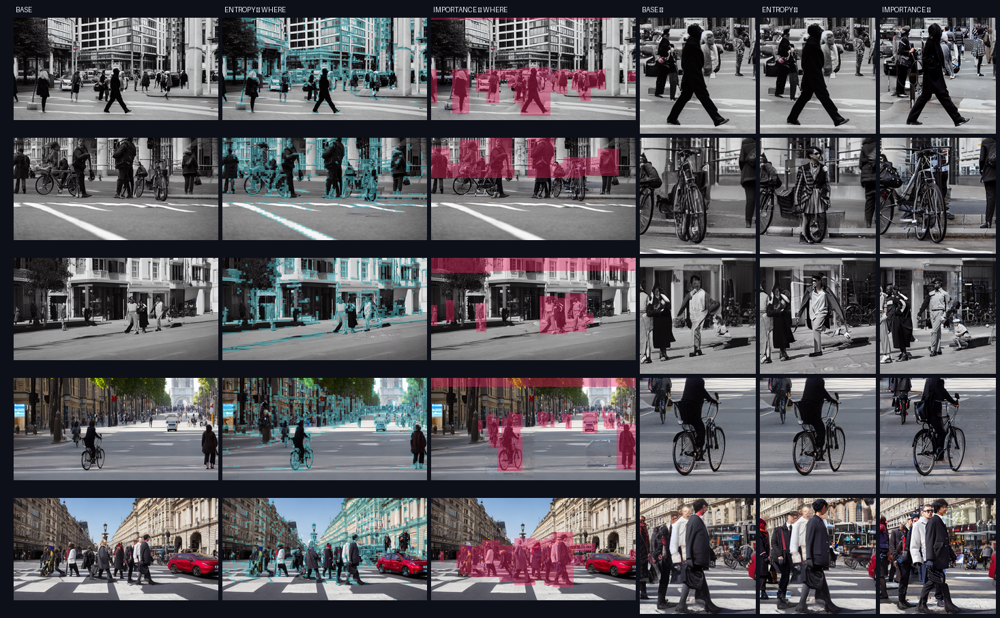

In [30]:
# %% ════════════════════════════════════════════════════════════════════
# CELL G6 — Allocation on the GENERATED image (corrected experiment)
# ----------------------------------------------------------------------
# WHAT WAS WRONG BEFORE
#   The grain maps were built from the REAL crop (its boxes, its pixels)
#   but applied to a GENERATED scene with unrelated content. The mask said
#   "pedestrian here"; the generated image had a building there. Nothing
#   measured was meaningful.
#
# THE CORRECTED DESIGN
#   1. Generate ONE base image per layout. It is SHARED by every arm, so
#      composition, lighting and content are identical by construction —
#      the strongest matched comparison available, stronger than matched
#      compute because it is the same image.
#   2. Run a pretrained detector ON THE GENERATED IMAGE to find where the
#      VRUs actually are. That is the importance field.
#   3. Compute entropy ON THE GENERATED IMAGE. That is D²iT's signal.
#   4. Each arm spends the SAME fine budget (K regions, same crop size,
#      same steps, same strength) — only the LOCATION differs.
#   5. Re-detect afterwards. The change in VRU detection confidence is a
#      quantitative result, and it is a direct preview of the proposal's
#      promised downstream-detector metric.
#
# This is the proposal's claim in its cleanest testable form: at identical
# refinement budget, does allocating by semantic importance beat allocating
# by texture entropy?
# ════════════════════════════════════════════════════════════════════
import torch, numpy as np, time, json, os
from PIL import Image, ImageDraw
import torch.nn.functional as F

from torchvision.models.detection import (fasterrcnn_resnet50_fpn_v2,
                                          FasterRCNN_ResNet50_FPN_V2_Weights)
_w  = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
det = fasterrcnn_resnet50_fpn_v2(weights=_w).eval().to(dev)
for p in det.parameters(): p.requires_grad_(False)
COCO_VRU = {1: "person", 2: "bicycle", 4: "motorcycle"}      # tier 1
COCO_VEH = {3: "car", 6: "bus", 8: "truck"}                  # tier 2
print("  detector ready (Faster R-CNN R50-FPN v2, COCO)")

K_REF     = 3          # regions refined per arm — identical across arms
REF_PX    = 192        # crop size in generated pixels — identical
REF_STR   = 0.45       # img2img strength — identical
DET_THR   = 0.45
SEED      = 0
ARMS      = ["entropy", "random", "importance"]


@torch.no_grad()
def detect(img, thr=DET_THR):
    x = torch.from_numpy(np.asarray(img)).permute(2, 0, 1).float().div(255).to(dev)
    o = det([x])[0]
    k = o["scores"] >= thr
    return (o["boxes"][k].cpu().numpy(), o["labels"][k].cpu().numpy(),
            o["scores"][k].cpu().numpy())


def vru_stats(img):
    b, l, s = detect(img)
    m = np.isin(l, list(COCO_VRU))
    return int(m.sum()), (float(s[m].mean()) if m.sum() else 0.0), b[m], s[m]


def score_map_from_boxes(boxes, labels, W, H, lh, lw):
    """Importance field measured ON THE GENERATED IMAGE: T1 VRU = 1.0,
    T2 vehicles = 0.6 — the same tiering as the proposal."""
    m = np.zeros((lh, lw), np.float32)
    for (x0, y0, x1, y1), c in zip(boxes, labels):
        wgt = 1.0 if c in COCO_VRU else (0.6 if c in COCO_VEH else 0.0)
        if wgt == 0: continue
        i0, i1 = int(np.floor(y0 / H * lh)), int(np.ceil(y1 / H * lh))
        j0, j1 = int(np.floor(x0 / W * lw)), int(np.ceil(x1 / W * lw))
        sl = (slice(max(0, i0), min(lh, i1)), slice(max(0, j0), min(lw, j1)))
        m[sl] = np.maximum(m[sl], wgt)
    return m


def centers_for(arm, img, boxes, labels, ent, seed, kk=K_REF):
    """K refinement centres. Same K, same crop size for every arm —
    only the selection rule differs."""
    W, H = img.size
    if arm == "importance":
        v = [(b, c) for b, c in zip(boxes, labels) if c in COCO_VRU]
        if not v: return []
        v.sort(key=lambda t: -((t[0][2]-t[0][0]) * (t[0][3]-t[0][1])))
        return [(float((b[0]+b[2])/2), float((b[1]+b[3])/2)) for b, _ in v[:kk]]
    if arm == "random":
        rng = np.random.default_rng(seed * 131 + 7)
        return [(float(rng.uniform(REF_PX/2, W-REF_PX/2)),
                 float(rng.uniform(REF_PX/2, H-REF_PX/2))) for _ in range(kk)]
    s, out = ent.copy(), []                                   # entropy
    lh, lw = s.shape
    for _ in range(kk):
        i, j = np.unravel_index(np.argmax(s), s.shape)
        if s[i, j] <= 0: break
        out.append((float((j+.5)/lw*W), float((i+.5)/lh*H)))
        s[max(0,i-4):i+5, max(0,j-8):j+9] = 0
    return out


def zoom_at(img, cx, cy, s=192, out=170):
    W, H = img.size
    x0 = int(np.clip(cx - s/2, 0, W - s)); y0 = int(np.clip(cy - s/2, 0, H - s))
    return img.crop((x0, y0, x0+s, y0+s)).resize((out, out), Image.LANCZOS)


def tint(img, mask, rgb, a=.42):
    im = np.asarray(img).astype(np.float32)
    m  = np.asarray(Image.fromarray((mask*255).astype(np.uint8))
                    .resize(img.size, Image.NEAREST)).astype(np.float32)[..., None]/255
    return Image.fromarray((im*(1-a*m) + np.array(rgb, np.float32)*a*m)
                           .clip(0, 255).astype(np.uint8))


# ── run ────────────────────────────────────────────────────────────────
PROMPT_POOL = [
    "candid street photography of pedestrians crossing a european city street, "
    "eye level, overcast daylight, sharp focus, 35mm",
    "a cyclist and pedestrians waiting at a crosswalk, european city, "
    "eye level, daylight, documentary photograph, 35mm",
    "people walking along a city sidewalk beside parked cars, european street, "
    "eye level, afternoon light, documentary photograph, 35mm",
    "pedestrians and a cyclist on a wide city avenue, european street scene, "
    "eye level, daylight, sharp focus, 35mm",
    "a crowded pedestrian crossing with cars waiting, european city, "
    "eye level, daylight, street photography, 35mm",
]

t0, rows, log = time.time(), [], []
for pi, prompt in enumerate(PROMPT_POOL):
    seed = SEED * 1000 + pi
    base = generate(prompt, g_field(None), seed)              # uniform CFG, shared
    b, l, s = detect(base)
    ent = entropy_cells(np.asarray(base), GLH, GLW)
    imp = score_map_from_boxes(b, l, *base.size, GLH, GLW)
    n0, c0, vb0, _ = vru_stats(base)
    if n0 == 0:
        print(f"    [{pi}] no VRU detected in base — skipped"); continue

    big = vb0[np.argmax((vb0[:,2]-vb0[:,0])*(vb0[:,3]-vb0[:,1]))]
    zc  = (float((big[0]+big[2])/2), float((big[1]+big[3])/2))  # same zoom for all

    outs, stats = {"base": base}, {"base": (n0, c0)}
    for arm in ARMS:
        cen = centers_for(arm, base, b, l, ent, seed)
        img = refine(base, cen, "a photorealistic pedestrian, sharp facial "
                                "detail, crisp clothing, street photography",
                     seed, px=REF_PX, strength=REF_STR)
        n, c, _, _ = vru_stats(img)
        outs[arm], stats[arm] = img, (n, c)
        img.save(f"{OUT_D}/single/p{pi}_{arm}.png")
        print(f"    [{pi}] {arm:11s} {len(cen)} regions · VRU {n} @ {c:.3f} "
              f"(base {n0} @ {c0:.3f}) · {time.time()-t0:.0f}s", flush=True)
    rows.append(dict(pi=pi, outs=outs, imp=imp, ent=topk_mask(ent, R_FINE),
                     zc=zc, stats=stats))
    log.append({k: list(v) for k, v in stats.items()} | {"pi": pi})

# ── quantitative summary — the actual result ───────────────────────────
print("\n  ── mean VRU detection confidence (matched refinement budget) ──")
for arm in ["base"] + ARMS:
    v = [r["stats"][arm][1] for r in rows if arm in r["stats"]]
    n = [r["stats"][arm][0] for r in rows if arm in r["stats"]]
    d = np.mean(v) - np.mean([r["stats"]["base"][1] for r in rows])
    print(f"    {arm:11s} conf {np.mean(v):.4f}  ({d:+.4f} vs base) · "
          f"mean {np.mean(n):.1f} VRUs")
win = sum(r["stats"]["importance"][1] > r["stats"]["entropy"][1] for r in rows)
print(f"    importance > entropy on {win}/{len(rows)} scenes")

# ── figure ─────────────────────────────────────────────────────────────
TW, TH, ZS, GAP, PADL, PADT = 300, 150, 170, 6, 20, 26
COLS = [("base", TW), ("entropy → where", TW), ("importance → where", TW),
        ("base ⟳", ZS), ("entropy ⟳", ZS), ("importance ⟳", ZS)]
gw = PADL + sum(w for _, w in COLS) + GAP*len(COLS)
gh = PADT + len(rows)*(max(TH, ZS) + GAP)
cv = Image.new("RGB", (gw, gh), (13, 16, 25)); d_ = ImageDraw.Draw(cv)
x = PADL
for name, w in COLS:
    d_.text((x+3, 8), name.upper(), fill=(232, 234, 240)); x += w + GAP
for r, R in enumerate(rows):
    y = PADT + r*(max(TH, ZS) + GAP); x = PADL
    panels = [
        R["outs"]["base"].resize((TW, TH), Image.LANCZOS),
        tint(R["outs"]["entropy"].resize((TW, TH), Image.LANCZOS),
             R["ent"], (60, 190, 200)),
        tint(R["outs"]["importance"].resize((TW, TH), Image.LANCZOS),
             topk_mask(R["imp"], R_FINE), (232, 40, 96)),
        zoom_at(R["outs"]["base"], *R["zc"], out=ZS),
        zoom_at(R["outs"]["entropy"], *R["zc"], out=ZS),
        zoom_at(R["outs"]["importance"], *R["zc"], out=ZS),
    ]
    for (nm, w), p in zip(COLS, panels):
        cv.paste(p, (x, y)); x += w + GAP

fig = f"{OUT_D}/grids/generated_allocation_seed{SEED}.png"
cv.save(fig)
json.dump(log, open(f"{OUT_D}/grids/generated_allocation_seed{SEED}.json", "w"), indent=2)
print(f"\n  ✓ {(time.time()-t0)/60:.1f} min → {fig}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

In [31]:
# %% ════════════════════════════════════════════════════════════════════
# CELL G7 — Evaluation at scale · four metrics · noise floor · seed sweep
# ----------------------------------------------------------------------
# Reproduces the project's measurement discipline on the generated data:
#
#   M1  ALLOCATION RECALL — of the cells actually covered by a VRU, what
#       fraction does each signal select at a FIXED budget (r_fine)? This
#       is finding 3.1 re-measured on generated scenes. Random gives the
#       chance line, so the entropy number is interpretable against it.
#   M2  VRU DETECTION CONFIDENCE — mean Faster R-CNN score on VRUs after
#       refinement, paired per scene against the shared base. A direct
#       preview of the proposal's downstream-detector metric.
#   M3  VRU-REGION SHARPNESS — Laplacian variance inside VRU boxes. Did
#       the fine pass actually add detail where it was aimed?
#   M4  BACKGROUND SHARPNESS — the guardrail. Object fidelity must not be
#       bought by wrecking everything else (the proposal's global-FID
#       guardrail, in cheap form).
#
#   NOISE FLOOR — a replicate arm: importance, byte-identical settings,
#   different refinement RNG only. Every effect below is reported as a
#   multiple of it. Nothing under the floor is claimed.
#
#   PAIRED — all arms refine THE SAME base image, so each scene is its own
#   control and per-scene differences are paired. Sign consistency across
#   scenes is reported alongside the mean, as in the 45-run ladder.
# ════════════════════════════════════════════════════════════════════
import numpy as np, torch, time, json, csv, os
from PIL import Image, ImageDraw
from scipy.ndimage import laplace

N_SCENES = 20
SEEDS    = (0, 1)                    # scene seeds; 20 × 2 = 40 scenes
ARMS_E   = ["entropy", "random", "importance"]

SUBJ = ["pedestrians crossing the street", "a cyclist and two pedestrians",
        "people waiting at a crosswalk", "pedestrians walking past parked cars",
        "a crowd of pedestrians on a sidewalk", "two cyclists and pedestrians",
        "a pedestrian pushing a stroller", "people stepping off a kerb",
        "a cyclist riding past pedestrians", "pedestrians beside a bus stop"]
SETT = ["european city street, overcast daylight", "city avenue, afternoon light",
        "narrow old town street, daylight", "wide boulevard, bright daylight"]

def scene_prompt(i):
    return (f"candid street photography of {SUBJ[i % len(SUBJ)]}, "
            f"{SETT[(i // len(SUBJ)) % len(SETT)]}, eye level, sharp focus, 35mm")


def sharp_split(img, boxes):
    """Laplacian variance inside VRU boxes vs everywhere else."""
    g   = np.asarray(img.convert("L")).astype(np.float32)
    lap = laplace(g) ** 2
    m   = np.zeros(g.shape, bool)
    for x0, y0, x1, y1 in boxes:
        m[max(0, int(y0)):int(y1), max(0, int(x0)):int(x1)] = True
    if m.sum() < 64 or (~m).sum() < 64: return None, None
    return float(lap[m].mean()), float(lap[~m].mean())


def vru_cell_mask(boxes, W, H, lh, lw):
    m = np.zeros((lh, lw), np.float32)
    for x0, y0, x1, y1 in boxes:
        i0, i1 = int(np.floor(y0/H*lh)), int(np.ceil(y1/H*lh))
        j0, j1 = int(np.floor(x0/W*lw)), int(np.ceil(x1/W*lw))
        m[max(0,i0):min(lh,i1), max(0,j0):min(lw,j1)] = 1.0
    return m


t0, REC = time.time(), []
for sd in SEEDS:
    for i in range(N_SCENES):
        seed  = sd * 10_000 + i
        prompt = scene_prompt(i)
        base = generate(prompt, g_field(None), seed)
        b, l, s = detect(base)
        vb = b[np.isin(l, list(COCO_VRU))]
        if len(vb) == 0:
            continue
        W, H = base.size
        ent  = entropy_cells(np.asarray(base), GLH, GLW)
        imp  = score_map_from_boxes(b, l, W, H, GLH, GLW)
        rng  = np.random.default_rng(seed * 977)

        # ── M1 allocation recall at fixed budget ───────────────────────
        vcell = vru_cell_mask(vb, W, H, GLH, GLW)
        masks = dict(importance=topk_mask(imp, R_FINE),
                     entropy=topk_mask(ent, R_FINE),
                     random=topk_mask(rng.random((GLH, GLW)), R_FINE))
        rec = {a: float((m * vcell).sum() / max(vcell.sum(), 1))
               for a, m in masks.items()}

        n0, c0, vb0, _ = vru_stats(base)
        s0v, s0b = sharp_split(base, vb0)
        row = dict(seed=sd, i=i, n_vru=n0, conf_base=c0,
                   shv_base=s0v, shb_base=s0b,
                   **{f"recall_{a}": v for a, v in rec.items()})

        # ── arms + replicate (noise floor) ─────────────────────────────
        for arm in ARMS_E + ["importance_rep"]:
            key = "importance" if arm == "importance_rep" else arm
            cen = centers_for(key, base, b, l, ent, seed)
            rsd = seed + (50_000 if arm.endswith("_rep") else 0)
            img = refine(base, cen, "a photorealistic pedestrian, sharp facial "
                                    "detail, crisp clothing, street photography",
                         rsd, px=REF_PX, strength=REF_STR)
            n, c, nb, _ = vru_stats(img)
            shv, shb = sharp_split(img, vb0)
            row |= {f"conf_{arm}": c, f"n_{arm}": n,
                    f"shv_{arm}": shv, f"shb_{arm}": shb}
        REC.append(row)
        print(f"    seed{sd} scene{i:02d} · {n0} VRU · recall "
              f"imp {rec['importance']:.2f} ent {rec['entropy']:.2f} "
              f"rnd {rec['random']:.2f} · {time.time()-t0:.0f}s", flush=True)

# ── summary ────────────────────────────────────────────────────────────
def col(k): return np.array([r[k] for r in REC if r.get(k) is not None], float)

print(f"\n{L}\n  N = {len(REC)} scenes · {(time.time()-t0)/60:.1f} min\n{L}")

print("\n  M1 · ALLOCATION RECALL  (fraction of VRU cells given fine capacity)")
for a in ["importance", "entropy", "random"]:
    v = col(f"recall_{a}")
    print(f"    {a:11s} {v.mean()*100:5.1f} %   (sd {v.std()*100:.1f})")
print(f"    chance line = r_fine = {R_FINE*100:.0f} %")

floor_conf = float(np.abs(col("conf_importance") - col("conf_importance_rep")).mean())
floor_shv  = float(np.abs(col("shv_importance") - col("shv_importance_rep")).mean())
print(f"\n  NOISE FLOOR (replicate arm)  conf {floor_conf:.5f} · sharp {floor_shv:.2f}")

print("\n  M2 · VRU DETECTION CONFIDENCE  (paired Δ vs shared base)")
cb = col("conf_base")
for a in ARMS_E:
    d = col(f"conf_{a}") - cb
    print(f"    {a:11s} {col(f'conf_{a}').mean():.4f}  Δ {d.mean():+.4f}  "
          f"({abs(d.mean())/max(floor_conf,1e-9):.1f}× floor) · "
          f"{int((d > 0).sum())}/{len(d)} scenes positive")
di = col("conf_importance") - col("conf_entropy")
print(f"    importance − entropy  {di.mean():+.4f}  "
      f"({abs(di.mean())/max(floor_conf,1e-9):.1f}× floor) · "
      f"{int((di > 0).sum())}/{len(di)} scenes favour importance")

print("\n  M3/M4 · SHARPNESS  (Laplacian variance, paired Δ vs base)")
sv, sb_ = col("shv_base"), col("shb_base")
for a in ARMS_E:
    dv = col(f"shv_{a}") - sv
    db = col(f"shb_{a}") - sb_
    print(f"    {a:11s} VRU Δ {dv.mean():+8.2f} ({abs(dv.mean())/max(floor_shv,1e-9):.1f}× floor)"
          f"  ·  background Δ {db.mean():+8.2f}   ← guardrail")

with open(f"{OUT_D}/eval_allocation.csv", "w", newline="") as f:
    w = csv.DictWriter(f, fieldnames=sorted({k for r in REC for k in r}))
    w.writeheader(); w.writerows(REC)
json.dump(dict(n=len(REC), r_fine=R_FINE, k_ref=K_REF, ref_px=REF_PX,
               strength=REF_STR, floor_conf=floor_conf, floor_shv=floor_shv,
               recall={a: float(col(f"recall_{a}").mean()) for a in
                       ["importance", "entropy", "random"]}),
          open(f"{OUT_D}/eval_allocation.json", "w"), indent=2)
print(f"\n  ✓ CSV → {OUT_D}/eval_allocation.csv")

    seed0 scene00 · 13 VRU · recall imp 1.00 ent 0.22 rnd 0.26 · 44s
    seed0 scene01 · 10 VRU · recall imp 0.62 ent 0.40 rnd 0.25 · 83s
    seed0 scene02 · 10 VRU · recall imp 0.41 ent 0.25 rnd 0.24 · 124s
    seed0 scene03 · 2 VRU · recall imp 1.00 ent 0.27 rnd 0.25 · 158s
    seed0 scene04 · 40 VRU · recall imp 0.40 ent 0.31 rnd 0.25 · 198s
    seed0 scene05 · 12 VRU · recall imp 0.59 ent 0.27 rnd 0.25 · 238s
    seed0 scene06 · 14 VRU · recall imp 1.00 ent 0.26 rnd 0.25 · 278s
    seed0 scene07 · 7 VRU · recall imp 0.39 ent 0.27 rnd 0.24 · 318s
    seed0 scene08 · 11 VRU · recall imp 0.93 ent 0.41 rnd 0.26 · 359s
    seed0 scene09 · 10 VRU · recall imp 0.40 ent 0.26 rnd 0.25 · 399s
    seed0 scene10 · 11 VRU · recall imp 1.00 ent 0.27 rnd 0.23 · 439s
    seed0 scene11 · 5 VRU · recall imp 0.64 ent 0.25 rnd 0.25 · 480s
    seed0 scene12 · 8 VRU · recall imp 0.65 ent 0.26 rnd 0.25 · 520s
    seed0 scene13 · 7 VRU · recall imp 1.00 ent 0.48 rnd 0.22 · 560s
    seed0 scene14 · 21 VRU 

In [32]:
# %% ════════════════════════════════════════════════════════════════════
# CELL G8 — Null control: is the sharpness loss diffusion, or resampling?
# ----------------------------------------------------------------------
# M3/M4 reported NEGATIVE sharpness for every arm, including random, and the
# damage tracked WHERE the refinement was applied rather than what it did.
# That is the signature of a measurement artefact, not a model effect.
#
# refine() does: crop 192px → upscale to 512 → img2img → downsample to 192.
# The LANCZOS round-trip alone is a low-pass filter. This cell separates the
# two contributions with a control that runs NO DIFFUSION:
#
#   NULL      crop → upscale → downsample → paste back        (resample only)
#   DIFFUSED  crop → upscale → img2img → downsample → paste   (what we ran)
#   AT-512    Laplacian measured BEFORE the downsample, i.e. refined 512 crop
#             against the upscaled input crop — diffusion's effect alone,
#             with the resampling held identical on both sides.
#
# If NULL reproduces the −200-ish delta, the M3/M4 result was the resample
# and must not be reported as a finding about allocation. Same failure mode
# as finding 3.3: a large, reproducible, arm-consistent effect that was an
# artefact of the measurement pipeline.
# ════════════════════════════════════════════════════════════════════
import numpy as np, time, json
from PIL import Image
from scipy.ndimage import laplace

N_CTRL = 12
def lapvar(im):
    return float((laplace(np.asarray(im.convert("L")).astype(np.float32)) ** 2).mean())


def null_refine(img, centers, px=REF_PX):
    """Identical geometry to refine(), but NO diffusion — resample only."""
    if not centers: return img
    base = np.asarray(img).astype(np.float32); H, W = base.shape[:2]
    for cx, cy in centers:
        x0 = int(np.clip(cx - px/2, 0, W - px)); y0 = int(np.clip(cy - px/2, 0, H - px))
        crop = img.crop((x0, y0, x0+px, y0+px)).resize((512, 512), Image.LANCZOS)
        out  = np.asarray(crop.resize((px, px), Image.LANCZOS)).astype(np.float32)
        w = _feather(px, px)
        base[y0:y0+px, x0:x0+px] = out * w + base[y0:y0+px, x0:x0+px] * (1 - w)
    return Image.fromarray(base.clip(0, 255).astype(np.uint8))


t0, R = time.time(), []
for i in range(N_CTRL):
    seed = i
    base = generate(scene_prompt(i), g_field(None), seed)
    b, l, s = detect(base)
    vb = b[np.isin(l, list(COCO_VRU))]
    if len(vb) == 0: continue
    W, H = base.size
    ent = entropy_cells(np.asarray(base), GLH, GLW)
    cen = centers_for("importance", base, b, l, ent, seed)
    if not cen: continue

    s0v, s0b = sharp_split(base, vb)
    nul = null_refine(base, cen)
    dif = refine(base, cen, "a photorealistic pedestrian, sharp facial detail, "
                            "crisp clothing, street photography",
                 seed, px=REF_PX, strength=REF_STR)
    nv, nb = sharp_split(nul, vb)
    dv, db = sharp_split(dif, vb)

    # at-512: diffusion alone, resampling identical on both sides
    a512 = []
    for cx, cy in cen:
        x0 = int(np.clip(cx - REF_PX/2, 0, W - REF_PX))
        y0 = int(np.clip(cy - REF_PX/2, 0, H - REF_PX))
        up = base.crop((x0, y0, x0+REF_PX, y0+REF_PX)).resize((512, 512), Image.LANCZOS)
        g  = torch.Generator(device=dev).manual_seed(seed * 977 + len(a512))
        rf = i2i(prompt="a photorealistic pedestrian, sharp facial detail, "
                        "crisp clothing, street photography", negative_prompt=NEG,
                 image=up, strength=REF_STR, guidance_scale=G_HI,
                 num_inference_steps=STEPS, generator=g).images[0]
        a512.append((lapvar(up), lapvar(rf)))

    R.append(dict(i=i, base_v=s0v, base_b=s0b,
                  null_dv=nv - s0v, null_db=nb - s0b,
                  dif_dv=dv - s0v, dif_db=db - s0b,
                  up512=float(np.mean([u for u, _ in a512])),
                  rf512=float(np.mean([r for _, r in a512]))))
    print(f"    scene{i:02d}  null ΔVRU {nv-s0v:+8.1f} · diffused ΔVRU {dv-s0v:+8.1f} "
          f"· at-512 {np.mean([r-u for u, r in a512]):+8.1f} · {time.time()-t0:.0f}s",
          flush=True)

c = lambda k: np.array([r[k] for r in R], float)
print(f"\n{L}\n  NULL CONTROL · N = {len(R)}\n{L}")
print(f"  resample only   ΔVRU {c('null_dv').mean():+9.2f} · Δbg {c('null_db').mean():+9.2f}")
print(f"  with diffusion  ΔVRU {c('dif_dv').mean():+9.2f} · Δbg {c('dif_db').mean():+9.2f}")
share = 100 * c('null_dv').mean() / c('dif_dv').mean() if c('dif_dv').mean() else float("nan")
print(f"  → resampling accounts for {share:.0f} % of the measured VRU loss")
print(f"\n  AT 512 (resampling identical both sides — diffusion alone)")
print(f"    upscaled input {c('up512').mean():9.2f}")
print(f"    refined output {c('rf512').mean():9.2f}")
print(f"    Δ {c('rf512').mean()-c('up512').mean():+9.2f}  "
      f"({'diffusion ADDS detail' if c('rf512').mean() > c('up512').mean() else 'diffusion removes detail'})")
json.dump(R, open(f"{OUT_D}/null_control.json", "w"), indent=2)
print(f"\n  ✓ {(time.time()-t0)/60:.1f} min → {OUT_D}/null_control.json")

    scene00  null ΔVRU  -1027.8 · diffused ΔVRU   -707.1 · at-512    +84.2 · 27s
    scene01  null ΔVRU   -649.7 · diffused ΔVRU   -578.4 · at-512   +100.0 · 49s
    scene02  null ΔVRU    -97.2 · diffused ΔVRU    +21.7 · at-512    +42.8 · 72s
    scene03  null ΔVRU   -490.1 · diffused ΔVRU   -111.4 · at-512    +59.5 · 89s
    scene04  null ΔVRU   -157.4 · diffused ΔVRU    -85.3 · at-512    +75.7 · 112s
    scene05  null ΔVRU   -357.1 · diffused ΔVRU   -266.6 · at-512    +32.2 · 135s
    scene06  null ΔVRU   -402.8 · diffused ΔVRU   -435.3 · at-512   +106.7 · 158s
    scene07  null ΔVRU    -26.3 · diffused ΔVRU   +110.8 · at-512    +27.5 · 181s
    scene08  null ΔVRU   -781.0 · diffused ΔVRU    -30.6 · at-512   +193.6 · 204s
    scene09  null ΔVRU   -180.8 · diffused ΔVRU    -60.7 · at-512    +53.2 · 227s
    scene10  null ΔVRU   -376.0 · diffused ΔVRU   +213.2 · at-512    +68.5 · 250s
    scene11  null ΔVRU   -324.7 · diffused ΔVRU   +101.0 · at-512    +66.8 · 273s

───────────────────

    scene00  ΔVRU  ent   +281.7 · rnd   +220.1 · imp   +277.4  · 36s
    scene01  ΔVRU  ent    +91.5 · rnd    +55.1 · imp   +163.6  · 66s
    scene02  ΔVRU  ent    +40.6 · rnd    +42.4 · imp    +58.2  · 98s
    scene03  ΔVRU  ent    +61.3 · rnd   +280.9 · imp   +728.8  · 128s
    scene04  ΔVRU  ent   +224.7 · rnd   +189.2 · imp    +89.8  · 159s
    scene05  ΔVRU  ent    +98.5 · rnd    +91.0 · imp    +96.2  · 191s
    scene06  ΔVRU  ent   +113.5 · rnd   +132.4 · imp   +217.6  · 223s
    scene07  ΔVRU  ent    +16.3 · rnd     +9.0 · imp    +16.3  · 255s
    scene08  ΔVRU  ent   +286.8 · rnd   +199.0 · imp   +461.6  · 287s
    scene09  ΔVRU  ent   +106.1 · rnd   +104.7 · imp    +83.2  · 319s
    scene10  ΔVRU  ent   +133.6 · rnd    +96.0 · imp    +67.5  · 351s
    scene11  ΔVRU  ent   +121.3 · rnd    +92.7 · imp   +176.4  · 382s
    scene12  ΔVRU  ent    +50.5 · rnd   +110.8 · imp    +85.4  · 414s
    scene13  ΔVRU  ent   +206.0 · rnd   +508.9 · imp   +474.9  · 446s
    scene14  ΔVRU  ent 

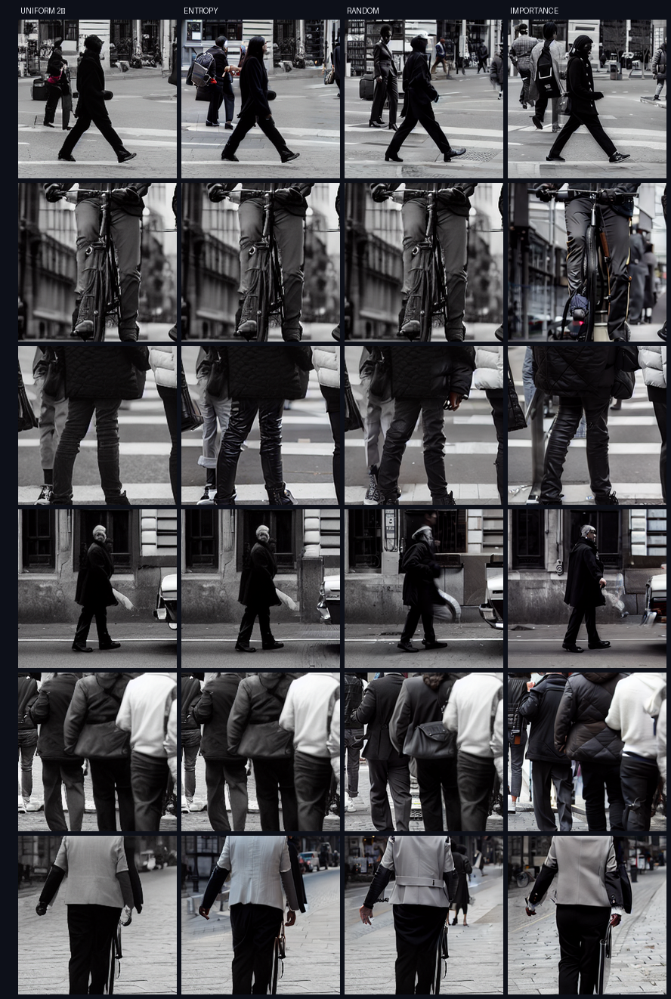

In [33]:
# %% ════════════════════════════════════════════════════════════════════
# CELL G9 — Multi-grain OUTPUT · refined regions kept at fine resolution
# ----------------------------------------------------------------------
# G8 showed the pipeline was destroying its own product: diffusion more than
# doubles detail at 512 (61.1 → 137.0, 12/12 scenes), and then the downsample
# back to 192 px throws it away, costing −405.9 before diffusion even runs.
#
# The fix is conceptual, not numerical. A multi-grain generator should EMIT a
# multi-grain image. Here the canvas is 2× the base; coarse regions are the
# upscaled base, and refined regions are pasted at their NATIVE 512 px with
# no resampling at all:
#
#     crop 256 from base → upscale 2× to 512 → img2img → paste at 512
#     into a 2× canvas.   256 × 2 = 512, so the paste is lossless.
#
# Every arm gets the same canvas, the same number of crops, the same size and
# strength. Only the LOCATION differs — so VRU-region sharpness now measures
# allocation instead of resampling.
#
# BASELINE: "uniform" is the 2× upscaled base with no refinement at all —
# the honest control for "spend nothing, just enlarge".
# ════════════════════════════════════════════════════════════════════
import numpy as np, torch, time, json
from PIL import Image, ImageDraw
from scipy.ndimage import laplace

SCALE   = 2
CROP_PX = 256                     # crop size in base pixels
OUT_PX  = CROP_PX * SCALE         # = 512, native SD size, lossless paste
N_MG    = 16
ARMS_MG = ["entropy", "random", "importance"]


def refine_canvas(base, centers, prompt, seed, strength=REF_STR):
    """Multi-grain render: coarse = upscaled base, fine = native 512 crops."""
    W, H = base.size
    canvas = base.resize((W * SCALE, H * SCALE), Image.LANCZOS)
    arr = np.asarray(canvas).astype(np.float32)
    for n, (cx, cy) in enumerate(centers):
        x0 = int(np.clip(cx - CROP_PX/2, 0, W - CROP_PX))
        y0 = int(np.clip(cy - CROP_PX/2, 0, H - CROP_PX))
        up = base.crop((x0, y0, x0+CROP_PX, y0+CROP_PX)).resize((OUT_PX, OUT_PX),
                                                                Image.LANCZOS)
        g  = torch.Generator(device=dev).manual_seed(seed * 977 + n)
        rf = i2i(prompt=prompt, negative_prompt=NEG, image=up, strength=strength,
                 guidance_scale=G_HI, num_inference_steps=STEPS,
                 generator=g).images[0]                       # 512, kept native
        X0, Y0 = x0 * SCALE, y0 * SCALE
        w = _feather(OUT_PX, OUT_PX, pad=40)
        arr[Y0:Y0+OUT_PX, X0:X0+OUT_PX] = (np.asarray(rf).astype(np.float32) * w
                                           + arr[Y0:Y0+OUT_PX, X0:X0+OUT_PX] * (1-w))
    return Image.fromarray(arr.clip(0, 255).astype(np.uint8))


REF_PROMPT = ("a photorealistic pedestrian, sharp facial detail, crisp clothing, "
              "natural skin texture, street photography")

t0, MG, keep = time.time(), [], []
for i in range(N_MG):
    seed = i
    base = generate(scene_prompt(i), g_field(None), seed)
    b, l, s = detect(base)
    vb = b[np.isin(l, list(COCO_VRU))]
    if len(vb) == 0: continue
    W, H = base.size
    ent = entropy_cells(np.asarray(base), GLH, GLW)
    vb2 = vb * SCALE                                  # boxes on the 2× canvas

    uni = base.resize((W*SCALE, H*SCALE), Image.LANCZOS)   # no refinement
    u_v, u_b = sharp_split(uni, vb2)
    row, outs = dict(i=i, uni_v=u_v, uni_b=u_b), {"uniform": uni}
    for arm in ARMS_MG:
        cen = centers_for(arm, base, b, l, ent, seed)
        img = refine_canvas(base, cen, REF_PROMPT, seed)
        v, bg = sharp_split(img, vb2)
        n, c, _, _ = vru_stats(img)
        row |= {f"{arm}_v": v, f"{arm}_b": bg, f"{arm}_conf": c}
        outs[arm] = img
    MG.append(row); keep.append((i, outs, vb))
    print(f"    scene{i:02d}  ΔVRU  ent {row['entropy_v']-u_v:+8.1f} · "
          f"rnd {row['random_v']-u_v:+8.1f} · imp {row['importance_v']-u_v:+8.1f}"
          f"  · {time.time()-t0:.0f}s", flush=True)

c = lambda k: np.array([r[k] for r in MG], float)
print(f"\n{L}\n  MULTI-GRAIN OUTPUT · N = {len(MG)}  (paired vs uniform 2× upscale)\n{L}")
print(f"  baseline uniform 2×   VRU {c('uni_v').mean():8.2f} · bg {c('uni_b').mean():8.2f}")
print("\n  M3 · VRU-REGION SHARPNESS        M4 · BACKGROUND (guardrail)")
for a in ARMS_MG:
    dv, db = c(f"{a}_v") - c("uni_v"), c(f"{a}_b") - c("uni_b")
    print(f"    {a:11s} Δ {dv.mean():+9.2f}  ({int((dv>0).sum())}/{len(dv)} positive)"
          f"   ·  bg Δ {db.mean():+9.2f}")
di = c("importance_v") - c("entropy_v")
print(f"\n    importance − entropy on VRU regions  {di.mean():+9.2f}  "
      f"· {int((di > 0).sum())}/{len(di)} scenes favour importance")

# ── figure ─────────────────────────────────────────────────────────────
SH = 210
rows_ = keep[:6]
cv = Image.new("RGB", (24 + 4*(SH+6), 26 + len(rows_)*(SH+6)), (13, 16, 25))
d_ = ImageDraw.Draw(cv)
for j, nm in enumerate(["UNIFORM 2×", "ENTROPY", "RANDOM", "IMPORTANCE"]):
    d_.text((24 + j*(SH+6) + 3, 8), nm, fill=(232, 234, 240))
for r, (i, outs, vb) in enumerate(rows_):
    y = 26 + r*(SH+6)
    big = vb[np.argmax((vb[:,2]-vb[:,0])*(vb[:,3]-vb[:,1]))] * SCALE
    cx, cy = (big[0]+big[2])/2, (big[1]+big[3])/2
    for j, a in enumerate(["uniform"] + ARMS_MG):
        cv.paste(zoom_at(outs[a], cx, cy, s=420, out=SH), (24 + j*(SH+6), y))
fig = f"{OUT_D}/grids/multigrain_zoom.png"
cv.save(fig)
json.dump(MG, open(f"{OUT_D}/multigrain.json", "w"), indent=2)
print(f"\n  ✓ {(time.time()-t0)/60:.1f} min → {fig}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

    [00] day   14 VRU · recall imp 0.67 ent 0.20 rnd 0.24 · 26s
    [01] day   10 VRU · recall imp 1.00 ent 0.40 rnd 0.23 · 49s
    [02] day    2 VRU · recall imp 1.00 ent 0.36 rnd 0.26 · 69s
    [03] day    7 VRU · recall imp 1.00 ent 0.68 rnd 0.29 · 91s
    [04] day   39 VRU · recall imp 0.43 ent 0.20 rnd 0.24 · 115s
    [05] day    9 VRU · recall imp 1.00 ent 0.52 rnd 0.25 · 138s
    [06] night  6 VRU · recall imp 1.00 ent 0.25 rnd 0.23 · 161s
    [07] night  9 VRU · recall imp 1.00 ent 0.33 rnd 0.25 · 183s
    [08] night  8 VRU · recall imp 1.00 ent 0.24 rnd 0.24 · 206s
    [09] night  5 VRU · recall imp 1.00 ent 0.19 rnd 0.25 · 229s
    [10] night 16 VRU · recall imp 1.00 ent 0.40 rnd 0.25 · 253s
    [11] night  3 VRU · recall imp 1.00 ent 0.21 rnd 0.23 · 276s

──────────────────────────────────────────────────────────────────────
  RECALL BY CONDITION  (the proposal's stress test)
──────────────────────────────────────────────────────────────────────
  day   (n=6)   importance  8

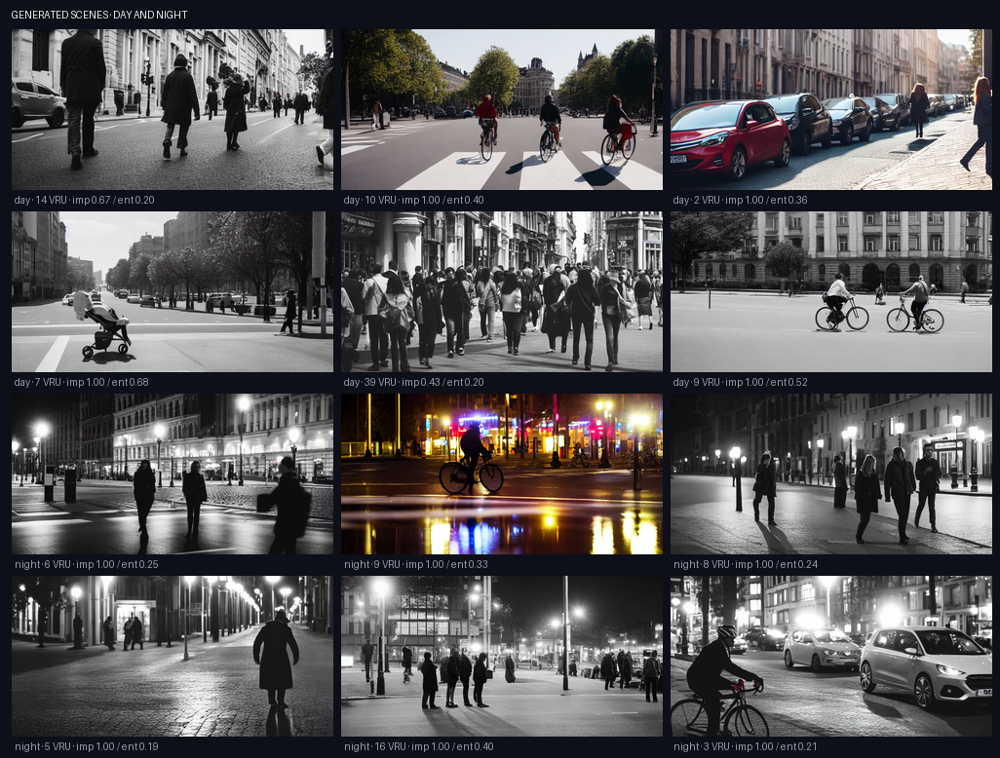

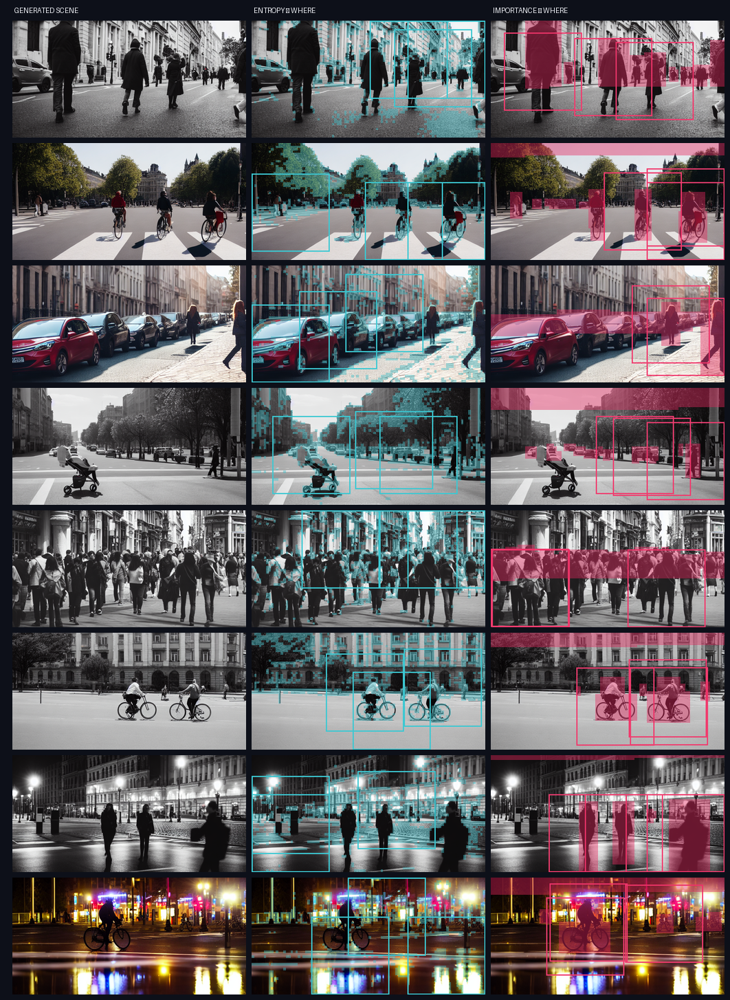

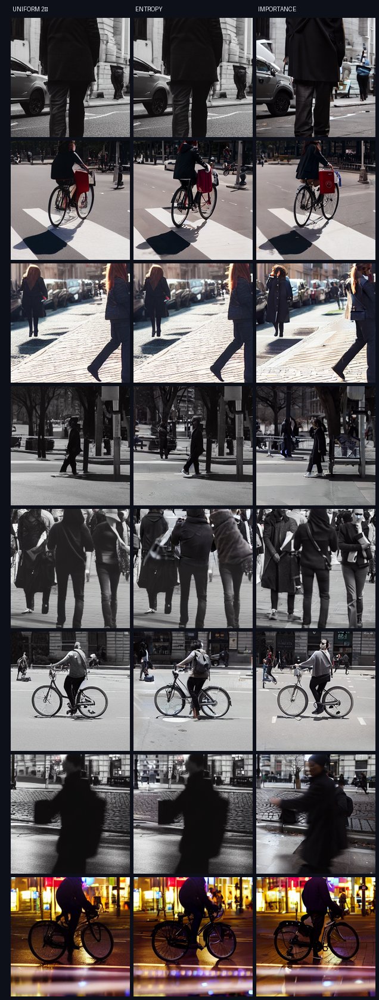

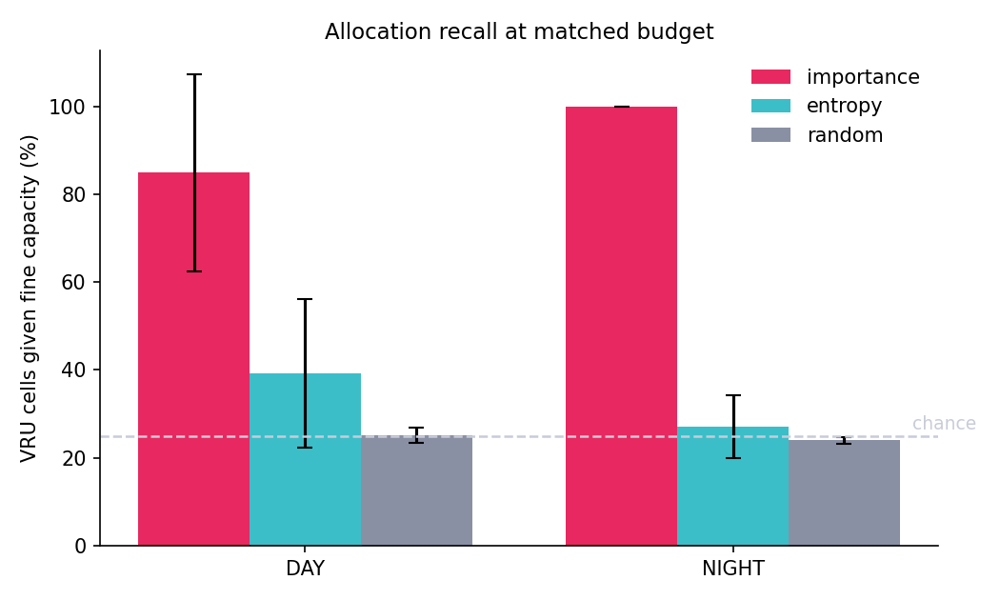

In [34]:
# %% ════════════════════════════════════════════════════════════════════
# CELL G10 — Report figures · day + night · four presentation-ready plates
# ----------------------------------------------------------------------
# Generates a varied scene set and renders everything needed for the write-up:
#
#   FIG 1  gallery         — 12 generated scenes, day and night, full frame
#   FIG 2  allocation      — base | entropy → where | importance → where,
#                            with the actual refinement rectangles drawn
#   FIG 3  zoom            — the same VRU at 4× across arms
#   FIG 4  recall          — M1 by lighting condition (bar chart)
#
# NEW MEASUREMENT, FREE: the proposal named the night subset as the stress
# test — "exactly the low-entropy / high-importance regime the method is
# designed for". Night scenes have LOW texture entropy on dark clothing but
# UNCHANGED semantic importance, so if the thesis is right, entropy's recall
# should fall further at night while importance holds. That is measured here
# and reported split by condition.
# ════════════════════════════════════════════════════════════════════
import numpy as np, torch, time, json
from PIL import Image, ImageDraw
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt

FIG_D = f"{OUT_D}/figures"; os.makedirs(FIG_D, exist_ok=True)

DAY = [
    "candid street photography of pedestrians crossing a european city street, overcast daylight, eye level, sharp focus, 35mm",
    "a cyclist and two pedestrians at a crosswalk, european city, daylight, documentary photograph, 35mm",
    "people walking along a sidewalk beside parked cars, european street, afternoon light, 35mm",
    "a pedestrian pushing a stroller across a wide avenue, european city, bright daylight, 35mm",
    "a crowd of pedestrians on a busy shopping street, european city, daylight, street photography, 35mm",
    "two cyclists riding past pedestrians, european boulevard, daylight, documentary photograph, 35mm",
]
NIGHT = [
    "candid street photography of pedestrians crossing at night, european city street, streetlights, dark, low light, 35mm",
    "a cyclist at a crosswalk at night, wet asphalt reflections, european city, streetlights, low light, 35mm",
    "pedestrians in dark clothing walking at night, european sidewalk, dim streetlight, low light, 35mm",
    "a pedestrian stepping off a kerb at night, headlights behind, european street, dark, low light, 35mm",
    "people waiting at a bus stop at night, european city, sodium streetlight, dark, low light, 35mm",
    "a cyclist riding at night past parked cars, european street, dim lighting, low light, 35mm",
]
SCENES = [(p, "day") for p in DAY] + [(p, "night") for p in NIGHT]
REF_P  = ("a photorealistic pedestrian, sharp facial detail, crisp clothing, "
          "natural skin texture, street photography")


def draw_regions(img, centers, px, rgb, w=4):
    im = img.copy(); d = ImageDraw.Draw(im); W, H = im.size
    for cx, cy in centers:
        x0 = int(np.clip(cx - px/2, 0, W - px)); y0 = int(np.clip(cy - px/2, 0, H - px))
        d.rectangle([x0, y0, x0+px, y0+px], outline=rgb, width=w)
    return im


t0, S = time.time(), []
for si, (prompt, cond) in enumerate(SCENES):
    seed = 4000 + si
    base = generate(prompt, g_field(None), seed)
    b, l, s = detect(base)
    vb = b[np.isin(l, list(COCO_VRU))]
    if len(vb) == 0:
        print(f"    [{si}] {cond}: no VRU detected — skipped"); continue
    W, H = base.size
    ent   = entropy_cells(np.asarray(base), GLH, GLW)
    imp   = score_map_from_boxes(b, l, W, H, GLH, GLW)
    vcell = vru_cell_mask(vb, W, H, GLH, GLW)
    rng   = np.random.default_rng(seed)
    m_e, m_i = topk_mask(ent, R_FINE), topk_mask(imp, R_FINE)
    m_r = topk_mask(rng.random((GLH, GLW)), R_FINE)
    rec = {a: float((m*vcell).sum()/max(vcell.sum(), 1))
           for a, m in [("entropy", m_e), ("importance", m_i), ("random", m_r)]}

    cen_e = centers_for("entropy",    base, b, l, ent, seed)
    cen_i = centers_for("importance", base, b, l, ent, seed)
    img_e = refine_canvas(base, cen_e, REF_P, seed)
    img_i = refine_canvas(base, cen_i, REF_P, seed)
    uni   = base.resize((W*SCALE, H*SCALE), Image.LANCZOS)

    big = vb[np.argmax((vb[:,2]-vb[:,0])*(vb[:,3]-vb[:,1]))]
    S.append(dict(si=si, cond=cond, base=base, ent_m=m_e, imp_m=m_i,
                  cen_e=cen_e, cen_i=cen_i, uni=uni, img_e=img_e, img_i=img_i,
                  zc=(float((big[0]+big[2])/2*SCALE), float((big[1]+big[3])/2*SCALE)),
                  n_vru=len(vb), **{f"rec_{k}": v for k, v in rec.items()}))
    print(f"    [{si:02d}] {cond:5s} {len(vb):2d} VRU · recall imp {rec['importance']:.2f} "
          f"ent {rec['entropy']:.2f} rnd {rec['random']:.2f} · {time.time()-t0:.0f}s",
          flush=True)

# ── FIG 1 · gallery ────────────────────────────────────────────────────
GW, GH, C = 330, 165, 3
rr = (len(S) + C - 1) // C
cv = Image.new("RGB", (12 + C*(GW+8), 30 + rr*(GH+22)), (13, 16, 25))
d_ = ImageDraw.Draw(cv); d_.text((12, 9), "GENERATED SCENES · DAY AND NIGHT",
                                 fill=(235, 237, 242))
for n, R in enumerate(S):
    x, y = 12 + (n % C)*(GW+8), 30 + (n//C)*(GH+22)
    cv.paste(R["base"].resize((GW, GH), Image.LANCZOS), (x, y))
    d_.text((x+3, y+GH+4), f"{R['cond']} · {R['n_vru']} VRU · "
            f"imp {R['rec_importance']:.2f} / ent {R['rec_entropy']:.2f}",
            fill=(150, 156, 172))
cv.save(f"{FIG_D}/fig1_gallery.png")

# ── FIG 2 · allocation contrast, with refinement regions drawn ─────────
TW, TH = 340, 170
sub = S[:8]
cv = Image.new("RGB", (18 + 3*(TW+8), 30 + len(sub)*(TH+8)), (13, 16, 25))
d_ = ImageDraw.Draw(cv)
for j, nm in enumerate(["GENERATED SCENE", "ENTROPY → WHERE", "IMPORTANCE → WHERE"]):
    d_.text((18 + j*(TW+8) + 3, 9), nm, fill=(235, 237, 242))
for r, R in enumerate(sub):
    y = 30 + r*(TH+8)
    a = R["base"]
    p1 = a.resize((TW, TH), Image.LANCZOS)
    p2 = tint(draw_regions(a, R["cen_e"], CROP_PX, (60, 200, 210)).resize((TW, TH),
              Image.LANCZOS), R["ent_m"], (60, 190, 200))
    p3 = tint(draw_regions(a, R["cen_i"], CROP_PX, (240, 60, 110)).resize((TW, TH),
              Image.LANCZOS), R["imp_m"], (232, 40, 96))
    for j, p in enumerate([p1, p2, p3]):
        cv.paste(p, (18 + j*(TW+8), y))
cv.save(f"{FIG_D}/fig2_allocation.png")

# ── FIG 3 · zoom strip ─────────────────────────────────────────────────
ZS, sub = 200, S[:8]
cv = Image.new("RGB", (18 + 3*(ZS+6), 30 + len(sub)*(ZS+6)), (13, 16, 25))
d_ = ImageDraw.Draw(cv)
for j, nm in enumerate(["UNIFORM 2×", "ENTROPY", "IMPORTANCE"]):
    d_.text((18 + j*(ZS+6) + 3, 9), nm, fill=(235, 237, 242))
for r, R in enumerate(sub):
    y = 30 + r*(ZS+6)
    for j, k in enumerate(["uni", "img_e", "img_i"]):
        cv.paste(zoom_at(R[k], *R["zc"], s=430, out=ZS), (18 + j*(ZS+6), y))
cv.save(f"{FIG_D}/fig3_zoom.png")

# ── FIG 4 · recall by lighting condition ───────────────────────────────
fig, ax = plt.subplots(figsize=(7, 4.2), dpi=150)
arms, cols = ["importance", "entropy", "random"], ["#e82860", "#3cbec8", "#8a90a4"]
conds, xw = ["day", "night"], 0.26
for a, (arm, cl) in enumerate(zip(arms, cols)):
    means = [np.mean([R[f"rec_{arm}"] for R in S if R["cond"] == c])*100 for c in conds]
    errs  = [np.std([R[f"rec_{arm}"] for R in S if R["cond"] == c])*100 for c in conds]
    ax.bar(np.arange(2) + (a-1)*xw, means, xw, yerr=errs, capsize=4,
           label=arm, color=cl)
ax.axhline(R_FINE*100, ls="--", c="#c8ccd8", lw=1.2)
ax.text(1.42, R_FINE*100 + 1.5, "chance", color="#c8ccd8", fontsize=9)
ax.set_xticks(range(2)); ax.set_xticklabels([c.upper() for c in conds])
ax.set_ylabel("VRU cells given fine capacity (%)")
ax.set_title("Allocation recall at matched budget", fontsize=11)
ax.legend(frameon=False); ax.spines[["top", "right"]].set_visible(False)
fig.tight_layout(); fig.savefig(f"{FIG_D}/fig4_recall.png"); plt.close(fig)

print(f"\n{L}\n  RECALL BY CONDITION  (the proposal's stress test)\n{L}")
for c_ in conds:
    sub_ = [R for R in S if R["cond"] == c_]
    if not sub_: continue
    line = "  ".join(f"{a} {np.mean([R[f'rec_{a}'] for R in sub_])*100:5.1f}%"
                     for a in arms)
    print(f"  {c_:5s} (n={len(sub_)})   {line}")
json.dump([{k: v for k, v in R.items() if not hasattr(v, "size")} for R in S],
          open(f"{FIG_D}/figures.json", "w"), indent=2, default=str)
print(f"\n  ✓ {(time.time()-t0)/60:.1f} min · 4 figures → {FIG_D}")
try:
    from IPython.display import display
    for f_ in ["fig1_gallery", "fig2_allocation", "fig3_zoom", "fig4_recall"]:
        display(Image.open(f"{FIG_D}/{f_}.png"))
except Exception: pass

down all are wateful cells

  layouts [6140, 6048, 6149, 6169, 5974]
    k06140 uniform     refined 0 regions · 7s
    k06140 entropy     refined 3 regions · 22s
    k06140 random      refined 3 regions · 35s
    k06140 importance  refined 3 regions · 48s
    k06048 uniform     refined 0 regions · 55s
    k06048 entropy     refined 3 regions · 67s
    k06048 random      refined 3 regions · 80s
    k06048 importance  refined 3 regions · 94s
    k06149 uniform     refined 0 regions · 100s
    k06149 entropy     refined 3 regions · 113s
    k06149 random      refined 3 regions · 127s
    k06149 importance  refined 3 regions · 140s
    k06169 uniform     refined 0 regions · 146s
    k06169 entropy     refined 3 regions · 159s
    k06169 random      refined 3 regions · 172s
    k06169 importance  refined 3 regions · 186s
    k05974 uniform     refined 0 regions · 192s
    k05974 entropy     refined 3 regions · 205s
    k05974 random      refined 3 regions · 218s
    k05974 importance  refined 3 regions · 232s

  ✓ 20 

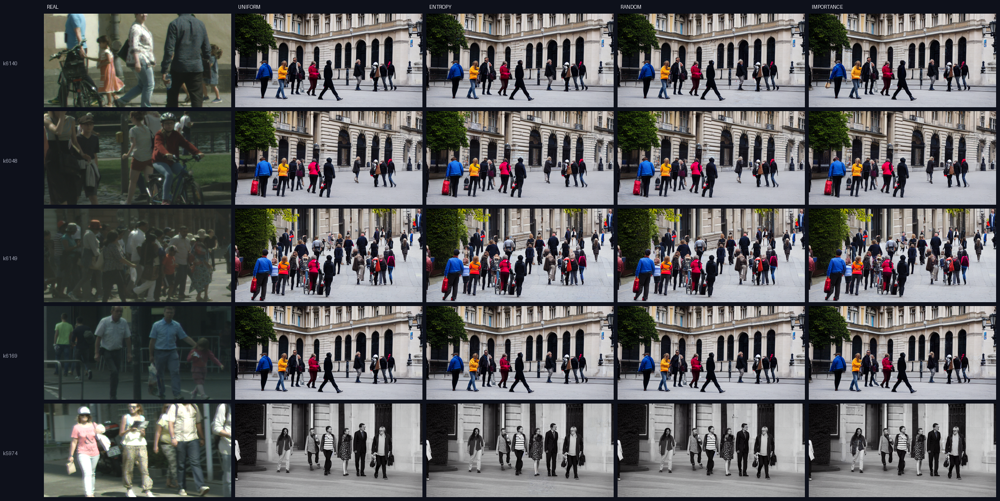

In [28]:

# %% ════════════════════════════════════════════════════════════════════
# CELL G3 — Run the four arms on N layouts · build the comparison figure
# ════════════════════════════════════════════════════════════════════
N_LAYOUTS = 5
SEED      = 0
ARMS      = ["uniform", "entropy", "random", "importance"]   # ours last

# pick val layouts that actually contain VRUs — otherwise the comparison
# is vacuous (nothing for importance to find)
_val = IDX["val"]
_nv  = [(int(k), float(VRU_FRAC[int(k)].sum())) for k in _val[:400]]
_nv.sort(key=lambda x: -x[1])
PICK = [k for k, v in _nv[:N_LAYOUTS]]
print(f"  layouts {PICK}")

t0, results = time.time(), {}
for k in PICK:
    gm = grain_maps(k, SEED)
    for arm in ARMS:
        img, cent = run_arm(k, arm, gm[arm], SEED)
        img.save(f"{OUT_D}/single/k{k:05d}_{arm}.png")
        results[(k, arm)] = img
        print(f"    k{k:05d} {arm:11s} refined {len(cent)} regions "
              f"· {time.time()-t0:.0f}s", flush=True)

# ── figure: rows = layouts, cols = [real] + arms ───────────────────────
TH, TW  = 192, 384
COLS    = ["real"] + ARMS
PADT, PADL = 28, 90
gridW = PADL + len(COLS) * (TW + 8)
gridH = PADT + len(PICK) * (TH + 8)
canvas = Image.new("RGB", (gridW, gridH), (14, 17, 27))

from PIL import ImageDraw
d = ImageDraw.Draw(canvas)
for c, name in enumerate(COLS):
    d.text((PADL + c * (TW + 8) + 6, 8), name.upper(), fill=(235, 235, 240))
for r, k in enumerate(PICK):
    y = PADT + r * (TH + 8)
    d.text((6, y + TH // 2), f"k{k}", fill=(160, 165, 180))
    for c, name in enumerate(COLS):
        im = (Image.fromarray(np.asarray(IMGS[k])) if name == "real"
              else results[(k, name)])
        canvas.paste(im.resize((TW, TH), Image.LANCZOS), (PADL + c * (TW + 8), y))

fig = f"{OUT_D}/grids/allocation_seed{SEED}.png"
canvas.save(fig)
json.dump(dict(layouts=PICK, arms=ARMS, seed=SEED, r_fine=R_FINE,
               g_lo=G_LO, g_hi=G_HI, g_uniform=G_UNIFORM, steps=STEPS,
               k_refine=K_REFINE, gen=[GEN_H, GEN_W],
               minutes=round((time.time() - t0) / 60, 1)),
          open(f"{OUT_D}/grids/allocation_seed{SEED}.json", "w"), indent=2)
print(f"\n  ✓ {len(PICK)*len(ARMS)} images · {(time.time()-t0)/60:.1f} min")
print(f"  figure → {fig}")
try:
    from IPython.display import display
    display(canvas)
except Exception:
    pass


  scanned 189 val crops with VRUs
  importance∩entropy IoU   mean 0.206 · median 0.199 · min 0.069 · max 0.434
  → the two signals select the same cells 21% of the time on these crops

  most-disagreeing layouts (these are the only ones worth showing):
    k06093  IoU 0.069  VRU coverage 0.119
    k06143  IoU 0.069  VRU coverage 0.193
    k06024  IoU 0.087  VRU coverage 0.327
    k06016  IoU 0.100  VRU coverage 0.013
    k06104  IoU 0.102  VRU coverage 0.279
  most-AGREEING (for contrast): [6028, 6131, 6044] at IoU 0.434
  guidance 3.0 → 18.0 · uniform 6.75 · split 0.35
    k06093 uniform     0 regions · 7s
    k06093 entropy     3 regions · 22s
    k06093 importance  3 regions · 36s
    k06143 uniform     0 regions · 42s
    k06143 entropy     3 regions · 55s
    k06143 importance  3 regions · 67s
    k06024 uniform     0 regions · 74s
    k06024 entropy     3 regions · 87s
    k06024 importance  3 regions · 100s
    k06016 uniform     0 regions · 107s
    k06016 entropy     3 regions

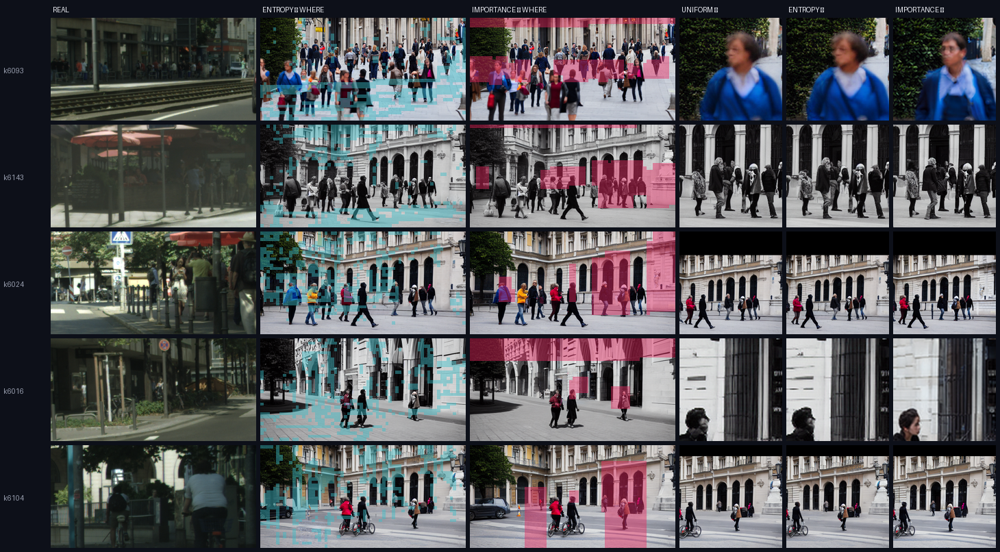

In [29]:
# %% ════════════════════════════════════════════════════════════════════
# CELL G4 — Diagnostic: WHERE do importance and entropy actually disagree?
# ----------------------------------------------------------------------
# The first figure showed four near-identical panels. Before tuning knobs,
# measure whether there is anything to see: if the importance grain map and
# the entropy grain map select the same cells, no sampler setting will make
# the arms differ, and the honest reading is that this crop regime is one
# where the two signals agree — which is finding 3.3 restated in pixels.
#
# Outputs a per-layout mask IoU and re-picks PICK to the layouts where the
# two signals disagree MOST. Those are the only layouts where the visual
# claim can be tested. No generation here — runs in ~20 s.
# ════════════════════════════════════════════════════════════════════
def entropy_cells(img_u8, lh, lw, bins=32):
    """Vectorised rewrite of the G1 version — same numbers, ~40× faster."""
    g  = np.asarray(Image.fromarray(img_u8).convert("L"))
    H, W = g.shape
    ph, pw = H // lh, W // lw
    g  = g[:lh * ph, :lw * pw].reshape(lh, ph, lw, pw).transpose(0, 2, 1, 3)
    q  = (g.reshape(lh * lw, ph * pw) // (256 // bins)).astype(np.int8)
    cnt = np.stack([(q == b).sum(1) for b in range(bins)], 1).astype(np.float32)
    p   = cnt / cnt.sum(1, keepdims=True).clip(1e-8)
    ent = -(np.where(p > 0, p * np.log2(p.clip(1e-12)), 0.0)).sum(1)
    return ent.reshape(lh, lw)


def mask_iou(a, b):
    inter = float((a * b).sum())
    union = float(((a + b) > 0).sum())
    return inter / max(union, 1.0)


N_SCAN = 200
_cand  = [int(k) for k in IDX["val"][:N_SCAN]]
rows   = []
for k in _cand:
    if float(VRU_FRAC[k].sum()) <= 0:          # no VRU ⇒ nothing to allocate to
        continue
    mi = topk_mask(importance_cells(k))
    me = topk_mask(entropy_cells(np.asarray(IMGS[k]), LH, LW))
    rows.append((k, mask_iou(mi, me), float(VRU_FRAC[k].mean())))

rows.sort(key=lambda r: r[1])                  # most disagreement first
iou_all = np.array([r[1] for r in rows])
print(f"  scanned {len(rows)} val crops with VRUs")
print(f"  importance∩entropy IoU   mean {iou_all.mean():.3f} · "
      f"median {np.median(iou_all):.3f} · min {iou_all.min():.3f} · "
      f"max {iou_all.max():.3f}")
print(f"  → the two signals select the same cells {iou_all.mean()*100:.0f}% "
      f"of the time on these crops")

PICK = [r[0] for r in rows[:5]]                # the 5 most-disagreeing layouts
print(f"\n  most-disagreeing layouts (these are the only ones worth showing):")
for k, iou, cov in rows[:5]:
    print(f"    k{k:05d}  IoU {iou:.3f}  VRU coverage {cov:.3f}")
print(f"  most-AGREEING (for contrast): "
      f"{[r[0] for r in rows[-3:]]} at IoU {rows[-1][1]:.3f}")


# %% ════════════════════════════════════════════════════════════════════
# CELL G5 — Allocation figure: show WHERE the capacity went, plus zoom
# ----------------------------------------------------------------------
# Two changes to make the effect legible:
#   * wider guidance gap (3 → 18 instead of 6 → 12)
#   * the figure now shows the ALLOCATION MAP as an overlay, not just the
#     output. At thumbnail scale a sharper face is invisible; a coloured
#     mask is not. Zoom insets on the largest VRU box carry the pixel-level
#     claim.
# ════════════════════════════════════════════════════════════════════
G_LO, G_HI = 3.0, 18.0
G_UNIFORM  = G_LO + (G_HI - G_LO) * R_FINE
CFG_SPLIT  = 0.35
REF_PX, REF_STRENGTH = 192, 0.45
SEED = 0
print(f"  guidance {G_LO} → {G_HI} · uniform {G_UNIFORM} · split {CFG_SPLIT}")


def overlay(img, mask, rgb):
    """Tint the fine cells so the allocation is visible at thumbnail size."""
    a = np.asarray(img).astype(np.float32)
    m = np.asarray(Image.fromarray((mask * 255).astype(np.uint8))
                   .resize(img.size, Image.NEAREST)).astype(np.float32)[..., None] / 255
    return Image.fromarray((a * (1 - .45 * m) + np.array(rgb, np.float32) * .45 * m)
                           .clip(0, 255).astype(np.uint8))


def vru_zoom(img, k, size=160):
    """Crop the largest VRU box, magnified — where the detail claim lives."""
    sel = MSK[k].bool() & (CLS[k] > 0) & (CLS[k] <= N_VRU_ID)
    b = BOX[k][sel].cpu().numpy()
    if len(b) == 0: return img.resize((size, size), Image.LANCZOS)
    b = b[np.argmax((b[:, 2] - b[:, 0]) * (b[:, 3] - b[:, 1]))]
    W, H = img.size
    cx, cy = (b[0] + b[2]) / 2 * W, (b[1] + b[3]) / 2 * H
    s = max(90, int(max((b[2] - b[0]) * W, (b[3] - b[1]) * H) * 1.3))
    x0 = int(np.clip(cx - s / 2, 0, W - s)); y0 = int(np.clip(cy - s / 2, 0, H - s))
    return img.crop((x0, y0, x0 + s, y0 + s)).resize((size, size), Image.LANCZOS)


t0, res, masks = time.time(), {}, {}
for k in PICK:
    gm = grain_maps(k, SEED); masks[k] = gm
    for arm in ["uniform", "entropy", "importance"]:
        img, cent = run_arm(k, arm, gm[arm], SEED)
        img.save(f"{OUT_D}/single/k{k:05d}_{arm}_v2.png")
        res[(k, arm)] = img
        print(f"    k{k:05d} {arm:11s} {len(cent)} regions · "
              f"{time.time()-t0:.0f}s", flush=True)

# ── figure: real | entropy alloc | importance alloc | 3 zooms ──────────
from PIL import ImageDraw
TW, TH, ZS = 300, 150, 150
COLS = [("real", TW), ("entropy → where", TW), ("importance → where", TW),
        ("uniform ⟳", ZS), ("entropy ⟳", ZS), ("importance ⟳", ZS)]
PADL, PADT, GAP = 74, 26, 6
gw = PADL + sum(w for _, w in COLS) + GAP * len(COLS)
gh = PADT + len(PICK) * (TH + GAP)
cv = Image.new("RGB", (gw, gh), (13, 16, 25)); d = ImageDraw.Draw(cv)

x = PADL
for name, w in COLS:
    d.text((x + 3, 8), name.upper(), fill=(232, 234, 240)); x += w + GAP
for r, k in enumerate(PICK):
    y = PADT + r * (TH + GAP); x = PADL
    d.text((5, y + TH // 2 - 4), f"k{k}", fill=(150, 156, 172))
    panels = [
        Image.fromarray(np.asarray(IMGS[k])).resize((TW, TH), Image.LANCZOS),
        overlay(res[(k, "entropy")].resize((TW, TH), Image.LANCZOS),
                masks[k]["entropy"], (60, 190, 200)),
        overlay(res[(k, "importance")].resize((TW, TH), Image.LANCZOS),
                masks[k]["importance"], (232, 40, 96)),
        vru_zoom(res[(k, "uniform")], k, ZS),
        vru_zoom(res[(k, "entropy")], k, ZS),
        vru_zoom(res[(k, "importance")], k, ZS),
    ]
    for (name, w), p in zip(COLS, panels):
        cv.paste(p, (x, y)); x += w + GAP

fig = f"{OUT_D}/grids/allocation_where_seed{SEED}.png"
cv.save(fig)
print(f"\n  ✓ {(time.time()-t0)/60:.1f} min → {fig}")
try:
    from IPython.display import display; display(cv)
except Exception: pass

In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F5 — PHASE B : sampling · 500 DDIM samples per arm
# ------------------------------------------------------------
# Layouts are drawn from the VAL crops (cycled to 500), so the same
# layout set feeds every arm — generated sets differ only by the
# checkpoint. CFG on both text and layout tokens jointly.
# ════════════════════════════════════════════════════════════════════
N_SAMPLES, DDIM_STEPS, CFG_SCALE = 500, 50, 4.0
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to(dev).eval().requires_grad_(False)
sched_ddim = DDIMScheduler.from_pretrained(MODEL_ID, subfolder="scheduler")

@torch.no_grad()
def sample_arm(name, seed, n=N_SAMPLES, bs=16, out_dir=None):
    load_lora_arm(name, seed)
    out_dir = out_dir or f"{LORA_D}/samples/{name}_sd{seed}"
    os.makedirs(out_dir, exist_ok=True)
    have = len(glob.glob(f"{out_dir}/*.png"))
    if have >= n: print(f"  ✓ {name} sd{seed}: {have} samples exist"); return out_dir

    g    = torch.Generator(device=dev).manual_seed(9000 + seed)
    vids = np.resize(IDX["val"], n)                       # cycle val layouts
    sched_ddim.set_timesteps(DDIM_STEPS, device=dev)
    from PIL import Image
    for i in range(have - have % bs, n, bs):
        ids = torch.from_numpy(vids[i:i + bs]).to(dev); B = len(ids)
        ctx_c = torch.cat([TXT_EMB[ids].float(),
                           adapter(BOX[ids], CLS[ids], MSK[ids])], 1)
        ctx_u = torch.cat([NULL_EMB.float().expand(B, -1, -1),
                           torch.zeros_like(ctx_c[:, 77:])], 1)
        z = torch.randn((B, 4, LH, LW), generator=g, device=dev)
        z = z * sched_ddim.init_noise_sigma
        for t in sched_ddim.timesteps:
            with torch.autocast("cuda", DTYPE):
                e_c = predict_eps(backbone(z, t.expand(B), encoder_hidden_states=ctx_c).sample)
                e_u = predict_eps(backbone(z, t.expand(B), encoder_hidden_states=ctx_u).sample)
            e = e_u + CFG_SCALE * (e_c - e_u)
            z = sched_ddim.step(e.float(), t, z).prev_sample
        img = vae.decode(z / VAE_SCALE).sample.clamp(-1, 1)
        img = ((img + 1) * 127.5).byte().permute(0, 2, 3, 1).cpu().numpy()
        for j in range(B):
            Image.fromarray(img[j]).save(f"{out_dir}/{i+j:04d}_c{vids[i+j]}.png")
        if i % 80 == 0: print(f"    {name} sd{seed}: {i+B}/{n}", flush=True)
    return out_dir

for sd in LORA_SEEDS:
    for name in LORA_ARMS:
        sample_arm(name, sd)



In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F6 — PHASE C-1 : object-region FID + KID  (PRIMARY METRIC 1)
# ------------------------------------------------------------
# FID on cropped VRU regions, not whole frames — the thing we claim to
# improve. fp32 Inception features, matched N, KID reported alongside
# (KID primary at this N, per the v2 FID-floor finding).
# ════════════════════════════════════════════════════════════════════
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.kid import KernelInceptionDistance
from PIL import Image

MIN_PX = 16                                            # skip sub-cell VRUs

def vru_crops_from(img_hw3, k):
    """all VRU boxes of crop k, cut from an H,W,3 uint8 array."""
    a, b = CC["offsets"][k], CC["offsets"][k + 1]
    outs = []
    for bb, ci in zip(CC["boxes"][a:b], CC["clsid"][a:b]):
        if ci > N_VRU_ID: continue
        x0, y0, x1, y1 = [int(round(v)) for v in bb]
        if x1 - x0 < MIN_PX or y1 - y0 < MIN_PX: continue
        outs.append(img_hw3[max(y0,0):y1, max(x0,0):x1])
    return outs

def to_batch(crops):
    t = [TF.interpolate(torch.from_numpy(c.copy()).permute(2,0,1)[None].float(),
                        (299, 299), mode="bilinear", antialias=True)[0] for c in crops]
    return torch.stack(t).byte()

def region_scores(sample_dir):
    fid = FrechetInceptionDistance(feature=2048, normalize=False).to(dev)
    fid.inception.float()                               # fp32 features (v2 fix)
    kid = KernelInceptionDistance(subset_size=100, normalize=False).to(dev)
    kid.inception.float()
    real = []
    for k in IDX["val"]: real += vru_crops_from(np.asarray(IMGS[k]), k)
    fk, gk = [], []
    for p in sorted(glob.glob(f"{sample_dir}/*.png")):
        k = int(p.split("_c")[-1][:-4])
        gk += vru_crops_from(np.asarray(Image.open(p)), k)
    n = min(len(real), len(gk))                         # matched N
    for chunk in range(0, n, 128):
        fid.update(to_batch(real[chunk:chunk+128]).to(dev), real=True)
        fid.update(to_batch(gk[chunk:chunk+128]).to(dev),   real=False)
        kid.update(to_batch(real[chunk:chunk+128]).to(dev), real=True)
        kid.update(to_batch(gk[chunk:chunk+128]).to(dev),   real=False)
    km, ks = kid.compute()
    return dict(n=n, obj_fid=fid.compute().item(),
                obj_kid=km.item(), obj_kid_sd=ks.item())

print(L); print("  OBJECT-REGION FID / KID (VRU crops, matched N)"); print(L)
RES = {}
for name in LORA_ARMS:
    for sd in LORA_SEEDS:
        d = f"{LORA_D}/samples/{name}_sd{sd}"
        if not glob.glob(f"{d}/*.png"): continue
        RES[(name, sd)] = r = region_scores(d)
        print(f"  {name} sd{sd}:  obj-FID {r['obj_fid']:7.2f}   "
              f"obj-KID {r['obj_kid']:.4f} ± {r['obj_kid_sd']:.4f}   (n={r['n']})")
json.dump({f"{k[0]}_sd{k[1]}": v for k, v in RES.items()},
          open(f"{LORA_D}/eval/object_region_fid_kid.json", "w"), indent=2)
# sign test across seeds, w=5 vs w=1 — same discipline as the ladder
try:
    diffs = [RES[("lora_w5", s)]["obj_kid"] - RES[("lora_w1", s)]["obj_kid"]
             for s in LORA_SEEDS]
    print(f"  Δ obj-KID (w5−w1) per seed: {['%+.4f' % d for d in diffs]}  "
          f"· sign-consistent: {len(set(np.sign(diffs))) == 1}")
except KeyError: pass



In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F7 — PHASE C-2 : downstream detector mAP  (PRIMARY METRIC 2)
# ------------------------------------------------------------
# Train Faster R-CNN on GENERATED data (labels = the conditioning
# layouts, known by construction), evaluate on REAL val crops.
# The honest end-to-end test of usefulness.
# ════════════════════════════════════════════════════════════════════
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchmetrics.detection import MeanAveragePrecision

DET_CLASSES = {1: "person", 2: "rider", 3: "vehicle"}   # + background=0
DET_EPOCHS, DET_BS = 4, 4

def det_targets(k, flip=False):
    a, b = CC["offsets"][k], CC["offsets"][k + 1]
    bx, lb = [], []
    for bb, ci in zip(CC["boxes"][a:b], CC["clsid"][a:b]):
        x0, y0, x1, y1 = bb
        if x1 - x0 < 4 or y1 - y0 < 4: continue
        if flip: x0, x1 = IMG_W - x1, IMG_W - x0
        bx.append([x0, y0, x1, y1])
        lb.append(min(int(ci), 2) if ci <= N_VRU_ID else 3)
    if not bx: bx, lb = [[0, 0, 1, 1]], [3]
    return dict(boxes=torch.tensor(bx, dtype=torch.float32),
                labels=torch.tensor(lb, dtype=torch.int64))

def train_eval_detector(sample_dir, tag):
    files = sorted(glob.glob(f"{sample_dir}/*.png"))
    det = fasterrcnn_resnet50_fpn(weights="DEFAULT")
    inf = det.roi_heads.box_predictor.cls_score.in_features
    det.roi_heads.box_predictor = \
        torchvision.models.detection.faster_rcnn.FastRCNNPredictor(inf, len(DET_CLASSES) + 1)
    det.to(dev).train()
    opt = torch.optim.SGD([p for p in det.parameters() if p.requires_grad],
                          lr=5e-3, momentum=0.9, weight_decay=5e-4)
    for ep in range(DET_EPOCHS):
        random.shuffle(files)
        for i in range(0, len(files) - DET_BS + 1, DET_BS):
            imgs, tgts = [], []
            for p in files[i:i + DET_BS]:
                k = int(p.split("_c")[-1][:-4])
                im = torch.from_numpy(np.asarray(Image.open(p)).copy()) \
                          .permute(2, 0, 1).float() / 255.
                imgs.append(im.to(dev)); tgts.append({k2: v.to(dev) for k2, v
                                                      in det_targets(k).items()})
            loss = sum(det(imgs, tgts).values())
            opt.zero_grad(set_to_none=True); loss.backward(); opt.step()
        print(f"    [{tag}] detector epoch {ep+1}/{DET_EPOCHS} loss {loss.item():.3f}",
              flush=True)
    det.eval()
    mAP = MeanAveragePrecision(iou_type="bbox", class_metrics=True)
    with torch.no_grad():
        for k in IDX["val"]:
            im = torch.from_numpy(np.asarray(IMGS[k]).copy()) \
                      .permute(2, 0, 1).float().to(dev) / 255.
            pred = det([im])[0]
            mAP.update([{k2: v.cpu() for k2, v in pred.items()}], [det_targets(k)])
    m = mAP.compute()
    del det; gc.collect(); torch.cuda.empty_cache()
    out = dict(map=m["map"].item(), map50=m["map_50"].item(),
               per_class={DET_CLASSES.get(int(c), int(c)): v.item()
                          for c, v in zip(m["classes"], m["map_per_class"])})
    print(f"  [{tag}]  mAP {out['map']:.4f} · mAP@50 {out['map50']:.4f} · {out['per_class']}")
    return out

print(L); print("  DETECTOR mAP — trained on generated, evaluated on real val"); print(L)
DET = {}
for name in LORA_ARMS:                                  # seed 0 first; add seeds later
    d = f"{LORA_D}/samples/{name}_sd0"
    if glob.glob(f"{d}/*.png"):
        DET[name] = train_eval_detector(d, name)
json.dump(DET, open(f"{LORA_D}/eval/detector_map.json", "w"), indent=2)



In [ ]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F8 — EXTRA : fine-tune OUR OWN dynamic DiTs with the safety weight
# ------------------------------------------------------------
# "Fine-tune the dynamic diffusion transformer for our specific case":
# instead of retraining anything, CONTINUE-TRAIN from the archived
# step-6000 EMA checkpoints with w ∈ {2, 5} — the safety-weight
# ablation the proposal promised (§5) and no arm ever ran.
#
# REQUIRES the consolidated pipeline file to have been run first
# (SECTIONS 0-9 definitions + SECTIONS 13-16 Phase-2 rebind), because
# it reuses PAD2iT, GPUBatcher, EMA, diffusion_loss, eval_full,
# save_ema, done_path, ARMS. Run e.g.:
#     %run pa_d2it_v2_pipeline.py     # or execute its cells in order
# ════════════════════════════════════════════════════════════════════
FT_STEPS  = 2000
FT_SEEDS  = (0, 1, 2)
FT_JOBS   = [                       # (base arm @ step 6000, new name, w)
    ("pa_d2it_s", "pa_d2it_s_w2_ft", 2.0),
    ("pa_d2it_s", "pa_d2it_s_w5_ft", 5.0),
    ("d2it_s",    "d2it_s_w5_ft",    5.0),   # entropy grain + safety weight,
]                                            # isolates weight from signal

def finetune_dit_arm(base, new_name, w, seed, steps=FT_STEPS, val_every=500):
    for sym in ("ARMS", "PAD2iT", "GPUBatcher", "EMA", "diffusion_loss",
                "eval_full", "save_ema", "done_path", "load_arm_ema", "cfg"):
        assert sym in globals(), f"pipeline not loaded — missing {sym} (see cell header)"
    ARMS[new_name] = dict(ARMS[base], w=w)
    if os.path.exists(done_path(new_name, seed)):
        h = json.load(open(done_path(new_name, seed)))
        if h and h[-1]["step"] >= steps:
            print(f"  ✓ {new_name} sd{seed} already complete"); return h

    a = ARMS[new_name]
    net0, _ = load_arm_ema(base, seed, 6000)            # archived EMA = init
    gc.collect(); torch.cuda.empty_cache()
    torch.manual_seed(seed)
    model = PAD2iT(a["k"], a["layout"], a["size"]).to(dev)
    model.load_state_dict(net0.state_dict()); del net0
    emod  = PAD2iT(a["k"], a["layout"], a["size"]).to(dev).eval().requires_grad_(False)
    ema   = EMA(model)
    opt   = torch.optim.AdamW(model.parameters(), lr=cfg.lr * 0.3,   # gentler for FT
                              betas=cfg.adam_betas, weight_decay=cfg.weight_decay)
    gen = torch.Generator(device=dev).manual_seed(seed * 100_003 + 777)
    tb  = GPUBatcher("train", signal=a["signal"], bs=cfg.batch_size, gen=gen)
    vb  = GPUBatcher("val",   signal=a["signal"], shuffle=False, augment=False)

    hist, step, t0 = [], 0, time.time()
    it = iter(lambda: None, 1)
    def stream():
        while True:
            for bb in tb: yield bb
    it = stream()
    while step < steps:
        b = next(it)
        loss = diffusion_loss(model, b, w=a["w"], a_coarse=a["ac"],
                              a_fine=a["af"], gen=gen)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), cfg.grad_clip)
        opt.step(); opt.zero_grad(set_to_none=True)
        ema.update(model, step); step += 1
        if step % val_every == 0 or step == steps:
            emod.load_state_dict(ema.state())
            v, pim, per_t = eval_full(emod, VF, vb)
            hist.append(dict(step=step, seed=seed, w=w, base=base, **v,
                             per_image=pim.tolist(), per_t=per_t))
            print(f"    {step:>6} | VRU {v['vru']:.4f} bg {v['bg']:.4f} "
                  f"ratio {v['ratio']:.3f}", flush=True)
        del loss, b
    save_ema(new_name, seed, step, ema, hist)
    json.dump(hist, open(done_path(new_name, seed), "w"))
    print(f"  ✓ {new_name} sd{seed} · {(time.time()-t0)/60:.1f} min")
    del model, emod, opt, ema, tb, vb; gc.collect(); torch.cuda.empty_cache()
    return hist

RUN_DIT_FT = False          # flip to True after the pipeline file is loaded
if RUN_DIT_FT:
    print(L); print("  DiT SAFETY-WEIGHT FINE-TUNE  (from step-6000 EMA)"); print(L)
    for sd in FT_SEEDS:
        for base, new_name, w in FT_JOBS:
            print(f"  ▶ {new_name}  sd{sd}  (init={base}@6000, w={w})")
            finetune_dit_arm(base, new_name, w, sd)
    # verdict: does w>1 move VRU error, and does bg pay for it?
    rows = []
    for base, new_name, w in FT_JOBS:
        for sd in FT_SEEDS:
            p = done_path(new_name, sd)
            if os.path.exists(p):
                h = json.load(open(p)); rows.append((new_name, sd, h[-1]))
    print(f"  {'arm':20s}{'sd':>4}{'VRU':>10}{'bg':>10}{'ratio':>8}")
    for n, sd, f in rows:
        print(f"  {n:20s}{sd:>4}{f['vru']:>10.4f}{f['bg']:>10.4f}{f['ratio']:>8.3f}")

print(L)
print("  PHASE 3 FILE READY.")
print("  A: F4 trains 6 LoRA runs (w1/w5 × 3 seeds, paired RNG, resumable)")
print("  B: F5 writes 500 DDIM samples/arm → v2/lora/samples/")
print("  C: F6 object-region FID+KID · F7 detector mAP → v2/lora/eval/")
print("  F8: set RUN_DIT_FT=True after loading the pipeline file to run the")
print("      safety-weight fine-tune of the archived dynamic-DiT checkpoints.")
print(L)

In [13]:
# %% ════════════════════════════════════════════════════════════════════
# CELL F4 — PHASE A : LoRA training · w ∈ {1,5} × 3 seeds · paired RNG
# ------------------------------------------------------------
# READY TO PASTE. Nothing to edit. Fixes applied:
#   [1] val_loss chunked at 8  → kills the 12 GB attention OOM on T4
#   [2] BS 8→4, ACCUM 4→8      → same effective batch 32, half the memory
#   [3] resumable every 250 steps, RNG-exact (paired-RNG guarantee holds)
#   [4] LORA_STEPS 4000→2000, val_every 500→100
#   [5] torch.amp.GradScaler (deprecation fixed)
# ════════════════════════════════════════════════════════════════════
LORA_ARMS  = {"lora_w1": dict(w=1.0), "lora_w5": dict(w=5.0)}
LORA_SEEDS = (0, 1, 2)
LORA_STEPS = 2000
BS, ACCUM  = 4, 8                                     # effective batch 32
LR_LORA, LR_ADAP = 1e-4, 1e-4
CFG_DROP   = 0.1
CKPT_EVERY = 250

def lora_ckpt(name, sd, step): return f"{LORA_D}/ckpt/{name}_sd{sd}_s{step:06d}.pt"
def lora_done(name, sd):       return f"{LORA_D}/logs/{name}_sd{sd}_done.json"
def lora_resume(name, sd):     return f"{LORA_D}/ckpt/{name}_sd{sd}_resume.pt"


def val_loss(w=None, n=96, seed=1234, chunk=8):
    """fixed-noise val, per-region ε-MSE. Chunked: same numbers, bounded memory."""
    g       = torch.Generator(device=dev).manual_seed(seed)
    ids_all = torch.from_numpy(IDX["val"][:n]).to(dev)
    n       = int(ids_all.shape[0])
    mu, sdv = LM[ids_all, 0].float(), LS[ids_all, 0].float()
    z0      = (mu + sdv * torch.randn(mu.shape, generator=g, device=dev)) * VAE_SCALE
    eps     = torch.randn(z0.shape, generator=g, device=dev)

    tot = dict(vru=0., bg=0., all=0.)
    for t_ in (100, 300, 500, 700):
        for s0 in range(0, n, chunk):
            sl  = slice(s0, min(s0 + chunk, n))
            ids = ids_all[sl]
            b   = int(ids.shape[0])
            t   = torch.full((b,), t_, device=dev, dtype=torch.long)
            a   = ALPHAS[t][:, None, None, None]
            zt  = a.sqrt() * z0[sl] + (1 - a).sqrt() * eps[sl]
            ctx = torch.cat([TXT_EMB[ids].float(),
                             adapter(BOX[ids], CLS[ids], MSK[ids])], 1)
            with torch.no_grad(), torch.autocast("cuda", DTYPE):
                pred = predict_eps(backbone(zt, t, encoder_hidden_states=ctx).sample)
            se  = (pred.float() - eps[sl]).pow(2).mean(1)
            cov = VRU_FRAC[ids].float()
            tot["vru"] += ((se * cov).sum((1, 2)) / cov.sum((1, 2)).clamp_min(1e-8)).sum().item()
            bg  = (1 - cov - VEH_FRAC[ids].float()).clamp_min(0)
            tot["bg"]  += ((se * bg).sum((1, 2)) / bg.sum((1, 2)).clamp_min(1e-8)).sum().item()
            tot["all"] += se.mean((1, 2)).sum().item()
            del pred, se, cov, bg, ctx, zt
    torch.cuda.empty_cache()
    return {k: v / (4 * n) for k, v in tot.items()}


def train_lora_arm(name, seed, steps=LORA_STEPS, val_every=100, ckpt_every=CKPT_EVERY):
    a = LORA_ARMS[name]
    if os.path.exists(lora_done(name, seed)):
        h = json.load(open(lora_done(name, seed)))
        if h and h[-1]["step"] >= steps:
            print(f"  ✓ {name} sd{seed} already complete @ {h[-1]['step']}"); return h

    torch.manual_seed(seed)
    for m in backbone.modules():
        if hasattr(m, "lora_A"):
            for l in m.lora_A.values(): nn.init.normal_(l.weight, std=1 / LORA_RANK)
            for l in m.lora_B.values(): nn.init.zeros_(l.weight)
    for p in adapter.parameters():
        if p.dim() > 1: nn.init.xavier_uniform_(p)
        else:           nn.init.zeros_(p)
    nn.init.zeros_(adapter.out[-1].weight); nn.init.zeros_(adapter.out[-1].bias)

    opt = torch.optim.AdamW(
        [{"params": [p for p in backbone.parameters() if p.requires_grad], "lr": LR_LORA},
         {"params": adapter.parameters(), "lr": LR_ADAP}],
        betas=(0.9, 0.999), weight_decay=0.0)
    scaler = torch.amp.GradScaler("cuda", enabled=not BF16)

    gen  = torch.Generator(device=dev).manual_seed(seed * 100_003 + 777)
    tids = torch.from_numpy(IDX["train"]).to(dev)
    hist, step = [], 0
    perm, pos  = None, 0

    rp = lora_resume(name, seed)
    if os.path.exists(rp):
        s = torch.load(rp, map_location=dev, weights_only=False)
        ms = backbone.state_dict()
        ms.update({k: v.float().to(dev) for k, v in s["lora"].items()})
        backbone.load_state_dict(ms)
        adapter.load_state_dict({k: v.float().to(dev) for k, v in s["adapter"].items()})
        opt.load_state_dict(s["opt"]); scaler.load_state_dict(s["scaler"])
        gen.set_state(s["gen"].cpu())
        step, hist = s["step"], s["hist"]
        perm = s["perm"].to(dev) if s["perm"] is not None else None
        pos  = s["pos"]
        print(f"    ↻ resumed at step {step} (RNG state restored)")

    def _snapshot(step_, perm_, pos_):
        return dict(step=step_, seed=seed, arm=a, hist=hist,
                    lora={k: v.half().cpu() for k, v in backbone.state_dict().items()
                          if "lora" in k},
                    adapter={k: v.half().cpu() for k, v in adapter.state_dict().items()},
                    opt=opt.state_dict(), scaler=scaler.state_dict(),
                    gen=gen.get_state(),
                    perm=(perm_.cpu() if perm_ is not None else None), pos=pos_)

    t0, tick = time.time(), time.time()
    while step < steps:
        if perm is None:
            perm = tids[torch.randperm(len(tids), generator=gen, device=dev)]
            pos  = 0
        i = pos
        while i <= len(perm) - BS and step < steps:
            ids  = perm[i:i + BS]
            flip = torch.rand(BS, generator=gen, device=dev) < 0.5
            fi   = flip.long()
            mu   = LM[ids, fi].float(); sdv = LS[ids, fi].float()
            z0   = (mu + sdv * torch.randn(mu.shape, generator=gen, device=dev)) * VAE_SCALE
            t    = torch.randint(0, 1000, (BS,), generator=gen, device=dev)
            eps  = torch.randn(z0.shape, generator=gen, device=dev)
            aT   = ALPHAS[t][:, None, None, None]
            zt   = aT.sqrt() * z0 + (1 - aT).sqrt() * eps

            box  = torch.where(flip[:, None, None],
                               torch.stack([1 - BOX[ids][..., 2], BOX[ids][..., 1],
                                            1 - BOX[ids][..., 0], BOX[ids][..., 3]], -1),
                               BOX[ids])
            drop = torch.rand(BS, generator=gen, device=dev) < CFG_DROP
            txt  = torch.where(drop[:, None, None],
                               NULL_EMB.float().expand(BS, -1, -1),
                               TXT_EMB[ids].float())
            lay  = adapter(box, CLS[ids], MSK[ids] * (~drop)[:, None].float())
            ctx  = torch.cat([txt, lay], 1)

            with torch.autocast("cuda", DTYPE):
                pred = predict_eps(backbone(zt, t, encoder_hidden_states=ctx).sample)
            W    = safety_weight(ids, flip, a["w"])
            loss = ((pred.float() - eps).pow(2).mean(1) * W).mean() / ACCUM
            scaler.scale(loss).backward()

            if (step + 1) % ACCUM == 0:
                scaler.unscale_(opt)
                torch.nn.utils.clip_grad_norm_(
                    [p for g_ in opt.param_groups for p in g_["params"]], 1.0)
                scaler.step(opt); scaler.update(); opt.zero_grad(set_to_none=True)
            step += 1
            i    += BS

            if step % val_every == 0 or step == steps:
                v = val_loss(a["w"])
                hist.append(dict(step=step, seed=seed, w=a["w"],
                                 train=loss.item() * ACCUM, **v))
                sps = val_every / (time.time() - tick); tick = time.time()
                print(f"    {step:>6} loss {loss.item()*ACCUM:.4f} | VRU {v['vru']:.4f} "
                      f"bg {v['bg']:.4f} | {sps:.2f} it/s "
                      f"eta {(steps-step)/max(sps,1e-9)/60:.0f}m", flush=True)

            if step % ckpt_every == 0 and step < steps:
                torch.save(_snapshot(step, perm, i), rp)

        pos = i
        if i > len(perm) - BS:
            perm = None

    torch.save(dict(step=step, seed=seed, arm=a, hist=hist,
                    lora={k: v.half().cpu() for k, v in backbone.state_dict().items()
                          if "lora" in k},
                    adapter={k: v.half().cpu() for k, v in adapter.state_dict().items()}),
               lora_ckpt(name, seed, step))
    json.dump(hist, open(lora_done(name, seed), "w"))
    if os.path.exists(rp): os.remove(rp)
    print(f"  ✓ {name} sd{seed}: {step} steps · {(time.time()-t0)/60:.1f} min")
    gc.collect(); torch.cuda.empty_cache()
    return hist


def load_lora_arm(name, seed, step=LORA_STEPS):
    p = lora_ckpt(name, seed, step)
    assert os.path.exists(p), f"no checkpoint: {p}"
    s = torch.load(p, map_location=dev, weights_only=False)
    assert s["step"] == step, f"step tag mismatch in {p}"
    ms = backbone.state_dict()
    ms.update({k: v.float().to(dev) for k, v in s["lora"].items()})
    backbone.load_state_dict(ms)
    adapter.load_state_dict({k: v.float().to(dev) for k, v in s["adapter"].items()})
    return s


# ── free memory left over from any previous OOM ───────────────────────
gc.collect(); torch.cuda.empty_cache()

# ── the 6-run ladder — seed-major, resumable, skip-if-done ─────────────
print(L); print(f"  PHASE A · {len(LORA_ARMS)} arms × {len(LORA_SEEDS)} seeds "
                f"× {LORA_STEPS} steps"); print(L)
for sd in LORA_SEEDS:
    for name in LORA_ARMS:
        print(f"  ▶ {name}  sd{sd}  (w={LORA_ARMS[name]['w']})")
        train_lora_arm(name, sd)

──────────────────────────────────────────────────────────────────────
  PHASE A · 2 arms × 3 seeds × 2000 steps
──────────────────────────────────────────────────────────────────────
  ▶ lora_w1  sd0  (w=1.0)
    ↻ resumed at step 250 (RNG state restored)


KeyboardInterrupt: 